In [1]:
import requests
import json
from random import random

# Define the base URL of the API
base_url = "http://localhost:3000"

# Send a vector to the '/insert' endpoint
def insert_vector(vector_data):
    url = f"{base_url}/insert"
    headers = {'Content-Type': 'application/json'}
    response = requests.post(url, headers=headers, data=json.dumps(vector_data))
    
    if response.status_code == 200:
        print(f"Response from '/insert': {response.json()}")
    else:
        print(f"Error: {response.status_code}")

def insert_batch_vector(vector_data):
    url = f"{base_url}/insert_batch"
    headers = {'Content-Type': 'application/json'}
    response = requests.post(url, headers=headers, data=json.dumps(vector_data))
    
    if response.status_code == 200:
        print(f"Response from '/insert': {response.json()}")
    else:
        print(f"Error: {response.status_code}")

# Request metadata from the '/metadata' endpoint
def get_metadata():
    url = f"{base_url}/metadata"
    headers = {'Content-Type': 'application/json'}
    response = requests.post(url, headers=headers)
    
    if response.status_code == 200:
        return json.loads(response.json().replace("(", "[").replace(")", "]"))
    else:
        print(f"Error: {response.status_code}")

# KNN Query function
def knn_query(vector, k):
    url = f"{base_url}/knn"
    payload = {"vector": vector, "k": k}
    headers = {'Content-Type': 'application/json'}

    response = requests.post(url, headers=headers, data=json.dumps(payload))
    
    if response.status_code == 200:
        print(f"Response from '/knn': {response.json()}")
        return response.json()
    else:
        print(f"Error: {response.status_code}")
        return None
def get_vectors_by_partition(partition_ids):
    url = f"{base_url}/vector/by_partitions"
    headers = {'Content-Type': 'application/json'}
    
    payload = {
        "ids": partition_ids
    }
    
    response = requests.post(url, headers=headers, data=json.dumps(payload))
    
    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error: {response.status_code} - {response.text}")
        return None
def get_edges_for_partition(partition_id):
    url = f"{base_url}/graph/by_partition"
    headers = {'Content-Type': 'application/json'}
    
    payload = {
        "id": partition_id
    }
    
    response = requests.post(url, headers=headers, data=json.dumps(payload))
    
    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error: {response.status_code} - {response.text}")
        return None
def get_inter_edges_for_partition(partition_id):
    url = f"{base_url}/graph/for_partition"
    headers = {'Content-Type': 'application/json'}
    
    payload = {
        "id": partition_id
    }
    
    response = requests.post(url, headers=headers, data=json.dumps(payload))
    
    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error: {response.status_code} - {response.text}")
        return None

# Example: Sending a vector to the API
vector_data = {
    "vector": [random(), random()]  # Example vector data
}

# Example: Requesting metadata
# get_metadata()


In [7]:
from random import uniform, gauss
from math import sqrt
from dataclasses import dataclass
from typing import List

@dataclass
class Cluster:
    center: List[float]
    radius: float
    num_points: int

def generate_random_points_nd(center: List[float], radius: float, num_points: int) -> List[List[float]]:
    """
    Generates random points within a given radius around a center point in n-dimensional space.
    """
    n = len(center)
    points = []

    for _ in range(num_points):
        # Generate a random direction
        random_direction = [gauss(0, 1) for _ in range(n)]
        norm = sqrt(sum(x ** 2 for x in random_direction))
        unit_vector = [x / norm for x in random_direction]
        
        # Generate a random distance within the radius
        random_distance = uniform(0, radius)
        
        # Compute the random point
        random_point = [center[i] + random_distance * unit_vector[i] for i in range(n)]
        points.append(random_point)

    return points

In [3]:
insert_vector({
    "vector": [random(), random()]  # Example vector data
})

Response from '/insert': Vector received


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import KDTree

def plot_partition_graph(partitions, edges, meta_data, inter_partition_edges=None):
    """
    Plot a graph where nodes represent vectors in partitions and edges represent connections between them.

    Args:
        partitions: List of tuples [(PartitionId: str, [(VectorId: str, [float, float])])]
        edges: List of lists of tuples [(VectorId: str, VectorId: str, weight: float)]
        meta_data: List of tuples [(PartitionId: str, size: int, centroid: [float, float])]
        inter_partition_edges: List of tuples [(VectorId: str, VectorId: str, weight: float)]
    """
    plt.figure(figsize=(12, 8))

    # Generate distinct colors for each partition
    num_partitions = len(partitions)
    colors = plt.cm.get_cmap('tab20', num_partitions)

    # Extract centroids and colors for partitions
    centroids = np.array([centroid for _, _, centroid in meta_data])
    partition_colors = [colors(i) for i in range(num_partitions)]

    # Create a KDTree for efficient nearest neighbor search
    tree = KDTree(centroids)

    # Set up grid points for background coloring
    vector_coords = np.concatenate([np.array([vector_data[1] for vector_data in vectors]) for _, vectors in partitions])
    x_min, x_max = vector_coords[:, 0].min(), vector_coords[:, 0].max()
    y_min, y_max = vector_coords[:, 1].min(), vector_coords[:, 1].max()

    x_dist = (x_max - x_min) * 0.1
    x_min, x_max = x_min - x_dist, x_max + x_dist
    y_dist = (y_max - y_min) * 0.1
    y_min, y_max = y_min - y_dist, y_max + y_dist

    x_vals = np.linspace(x_min, x_max, 500)
    y_vals = np.linspace(y_min, y_max, 500)
    xv, yv = np.meshgrid(x_vals, y_vals)
    grid_points = np.c_[xv.ravel(), yv.ravel()]

    # Find nearest centroid for each grid point
    _, indices = tree.query(grid_points)
    
    # Color the background based on the nearest centroid
    background_colors = np.array([partition_colors[idx] for idx in indices])
    plt.scatter(grid_points[:, 0], grid_points[:, 1], c=background_colors, marker='s', s=1, alpha=0.1)

    # Plot partition labels behind everything
    for partition_index, (partition_id, _, centroid) in enumerate(meta_data):
        plt.text(
            centroid[0], centroid[1], partition_id, 
            fontsize=12, color='gray', alpha=0.3, 
            ha='center', va='center', zorder=-1
        )

    # Plot nodes for each partition
    node_positions = {}
    for partition_index, (partition_id, vectors) in enumerate(partitions):
        partition_color = partition_colors[partition_index]
        vector_coords = np.array([vector_data[1] for vector_data in vectors])
        if len(vector_coords) > 0:
            plt.scatter(
                vector_coords[:, 0], 
                vector_coords[:, 1], 
                s=40, 
                c=[partition_color], 
                edgecolors='k', 
                marker='x', 
                label=f"Partition {partition_id}"
            )
            for vector_id, coord in zip([vec[0] for vec in vectors], vector_coords):
                node_positions[vector_id] = coord

    # Plot centroids from meta_data
    for partition_index, (partition_id, size, centroid) in enumerate(meta_data):
        plt.scatter(
            centroid[0], centroid[1], 
            s=max(10, size * 5), 
            c=[partition_colors[partition_index]], 
            edgecolors='white', 
            marker='o', 
            label=f"Centroid for {partition_id}"
        )

    # Plot edges within partitions
    for partition_edges in edges:
        for vector_id1, vector_id2, weight in partition_edges:
            if vector_id1 in node_positions and vector_id2 in node_positions:
                pos1 = node_positions[vector_id1]
                pos2 = node_positions[vector_id2]
                plt.plot(
                    [pos1[0], pos2[0]], 
                    [pos1[1], pos2[1]], 
                    'k--', 
                    linewidth=max(0.5, weight * 0.1), 
                    alpha=0.7
                )

    # Plot inter-partition edges (solid lines)
    if inter_partition_edges:
        for vector_id1, vector_id2, weight in inter_partition_edges:
            if vector_id1 in node_positions and vector_id2 in node_positions:
                pos1 = node_positions[vector_id1]
                pos2 = node_positions[vector_id2]
                plt.plot(
                    [pos1[0], pos2[0]], 
                    [pos1[1], pos2[1]], 
                    color='purple', 
                    linewidth=max(0.5, weight * 0.1), 
                    alpha=0.9
                )

    plt.title("Partition Graph with Weighted Edges and Metadata Centroids")
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.grid(True)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


In [3]:
get_metadata()

[['5038660a-443a-4756-9970-892807e4cd21', 0, [0.0, 0.0]]]

In [36]:
get_vectors_by_partition(["48d29567-64da-442b-9c61-0efb16edcec5"])

[['48d29567-64da-442b-9c61-0efb16edcec5',
  [['5d4fb82c-92ab-4d0e-b6c8-d4c9317d5b06', [0.49196124, 0.5063975]],
   ['6841fdca-22ae-4e9e-b1aa-e868381c8da8', [0.5174167, 0.5030689]],
   ['2a3ed3e4-3340-4519-bf10-4646d13045bc', [0.47108272, 0.46271962]],
   ['bdbc8a48-9743-4dac-8e64-3aac641edc24', [0.49836767, 0.51963776]],
   ['d663a6e6-afe8-403f-949a-e0c06d0b98c2', [0.50002426, 0.49994147]],
   ['f72e5316-f342-443a-9027-8408556c5bd0', [0.47620416, 0.4839253]],
   ['3ad8b9af-3946-49b2-98b2-d3562c95bffa', [0.5006286, 0.4980246]],
   ['ae59df61-1fc2-4b40-9dd1-fce0275fb17d', [0.47962406, 0.47151384]],
   ['ee0702a5-a3eb-407a-8e8d-30e0dd4e302d', [0.53252465, 0.5275457]],
   ['0e268826-a4e2-4dc1-8a6c-b257b88291c3', [0.49630225, 0.5131051]],
   ['a7932311-2d69-434e-84c5-95ee0f85c17e', [0.5019841, 0.5136243]],
   ['873b51ac-80c3-40ad-9c1c-954afdcf80a3', [0.4858935, 0.48840034]],
   ['85feb35f-6030-4fda-af36-c1ca2f6f6842', [0.50023735, 0.50985646]],
   ['65cc1737-1ea6-49a2-9a64-fe2d2e81e277', [0

In [37]:
get_edges_for_partition("48d29567-64da-442b-9c61-0efb16edcec5")

[['ae59df61-1fc2-4b40-9dd1-fce0275fb17d',
  '2a3ed3e4-3340-4519-bf10-4646d13045bc',
  0.00015029286],
 ['9db37235-8352-45b0-8597-b36f25a4e784',
  '6841fdca-22ae-4e9e-b1aa-e868381c8da8',
  0.0007306375],
 ['2a3ed3e4-3340-4519-bf10-4646d13045bc',
  'bdbc8a48-9743-4dac-8e64-3aac641edc24',
  0.0039841435],
 ['bc3c460f-9513-43ec-878f-0e2229c4c9a7',
  'd663a6e6-afe8-403f-949a-e0c06d0b98c2',
  8.5590005e-07],
 ['ee0702a5-a3eb-407a-8e8d-30e0dd4e302d',
  '9db37235-8352-45b0-8597-b36f25a4e784',
  0.00115417],
 ['63755c12-a5d2-4209-bf64-6b023590a581',
  '3ad8b9af-3946-49b2-98b2-d3562c95bffa',
  0.00022493099],
 ['65cc1737-1ea6-49a2-9a64-fe2d2e81e277',
  '930ec5a5-f6f6-42db-934c-14f68ee1d1d8',
  0.0003738994],
 ['2a3ed3e4-3340-4519-bf10-4646d13045bc',
  'ee0702a5-a3eb-407a-8e8d-30e0dd4e302d',
  0.00797753],
 ['a7932311-2d69-434e-84c5-95ee0f85c17e',
  '0e268826-a4e2-4dc1-8a6c-b257b88291c3',
  3.255326e-05],
 ['85feb35f-6030-4fda-af36-c1ca2f6f6842',
  'a7932311-2d69-434e-84c5-95ee0f85c17e',
  1.7247

In [70]:
meta_data = get_metadata()
meta_data

[['346825d5-f62a-4930-89a7-c584f3b265bc', 19, [0.17161156, -0.10144406]],
 ['c4f0c43c-3583-4ffc-abdf-b9b42f00ea5d', 11, [0.31283537, 0.77186984]],
 ['d19cb7ef-0be0-446a-b5a0-9fd98db02aac', 15, [0.8573527, 0.09194278]],
 ['ef5bf66c-3fa6-4560-93ab-d2c64457cf03', 16, [0.21355622, 0.7359138]],
 ['4c1cab11-a3f5-49ae-a220-d9791269a4e2', 14, [0.49119043, 0.49641722]],
 ['f9c5a514-fe51-4873-aa88-938cec7e78c5', 9, [0.36235896, 0.42566603]],
 ['53417410-12d4-4068-bf8d-fda9a6bed500', 20, [-0.24046786, -0.09098538]],
 ['7fcaa732-656c-4614-9d81-901b7c9542c5', 9, [0.5251461, 0.5008833]],
 ['f08682b9-96b1-49db-abab-446b691ee0cc', 15, [0.81644905, 0.05529037]],
 ['5b44583b-7cc7-4c00-b872-bdc0344ef3d2', 15, [-0.037707552, 0.011807745]],
 ['63f1d6a9-f821-45f7-8bb6-2e639c2746c0', 20, [0.9007182, 0.106449306]],
 ['5182b1ca-f7b0-4131-a3a2-eb61c0bbf49e', 7, [0.009034587, 0.20140085]],
 ['ddff2465-7835-4f04-a367-7840e802cf5e', 8, [0.33003992, 0.06899881]]]

In [71]:
get_inter_edges_for_partition("f08682b9-96b1-49db-abab-446b691ee0cc")

[['a0c455f6-a8d3-46f6-bb0a-8f25b67e2f82',
  'bc8deaad-2fdd-499b-96a6-fd3fe00c4699',
  0.0008280633],
 ['ebdde2ee-59a1-4f9e-8725-5c9345d69375',
  'dd0e867d-6543-424a-91af-5e8b0d53a1ff',
  0.3075077],
 ['ae92330f-5b76-43f6-8946-7082b52643c1',
  'ebdde2ee-59a1-4f9e-8725-5c9345d69375',
  0.3207276],
 ['c30378af-3804-4aeb-8a7b-53b786bfde4c',
  '4ffc9cfa-86d2-4b0e-863b-07d9a7656d8c',
  8.555371e-05],
 ['ba39f289-b372-47c2-a773-a2b942c2d136',
  '85390b89-1484-4312-9bcf-0c245f329bef',
  0.0070454427],
 ['ba39f289-b372-47c2-a773-a2b942c2d136',
  'ebdde2ee-59a1-4f9e-8725-5c9345d69375',
  0.0056341146],
 ['ba39f289-b372-47c2-a773-a2b942c2d136',
  'd7927c1b-bd92-4489-b9fe-e63de46d9b7c',
  0.0054850695],
 ['ae92330f-5b76-43f6-8946-7082b52643c1',
  '01407457-9065-416c-8027-7ad3851c2b5b',
  0.36847183],
 ['ae92330f-5b76-43f6-8946-7082b52643c1',
  '27dc6bee-6d58-4b46-954b-89e044cb3c2e',
  0.2502957],
 ['67b22acd-e1ef-483b-a138-85df75a85593',
  '27dc6bee-6d58-4b46-954b-89e044cb3c2e',
  0.48347762],
 ['

In [4]:
from functional import seq
meta_data = get_metadata()
partitions = get_vectors_by_partition(seq(meta_data).map(lambda x: x[0]).list())
edges = seq(partitions).map(lambda x: get_edges_for_partition(x[0])).list()
inter_edges = seq(partitions).map(lambda x: get_inter_edges_for_partition(x[0])).flatten().list()
plot_partition_graph(partitions, edges, meta_data, inter_edges)

C:\Users\hasin\AppData\Local\Temp\ipykernel_67172\3131095296.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', num_partitions)


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

<Figure size 1200x800 with 0 Axes>

# Multiple Insert After restart test

In [8]:
# vector_groups = [[[random(), random()] for i1 in range(10)] for i2 in range(3)]

# for group in vector_groups:

#     for i, vector in enumerate(group):
#         if i % 5 == 0:
#             get_metadata()

#         insert_vector({
#             "vector": vector  # Example vector data
#         })
#     get_metadata()

#     input("Press enter after restart")

# Large Input test

In [9]:
vectors = [[random(), random()] for i in range(10_000)]

In [15]:
# Define clusters
clusters = [
    Cluster(center=[0.5, 0.5], radius=0.05, num_points=40),  # Dense cluster
    # Cluster(center=[0., 0.], radius=.5, num_points=100),    # Sparse cluster
    Cluster(center=[0.25, 0.75], radius=0.15, num_points=50),   # Medium density
    # Cluster(center=[0.9, 0.1], radius=0.1, num_points=80),    # Mixed density
]

# Add a composite cluster with sub-clusters to form a non-circular shape
composite_cluster_centers = [
    [0.5, 0.5],
    [0.55, 0.55],
    [0.5, 0.6],
    [0.45, 0.55],
]
composite_points = []

for sub_center in composite_cluster_centers:
    points = generate_random_points_nd(sub_center, 0.05, 50)  # Smaller clusters
    composite_points.extend(points)

vectors = []

# Append the composite cluster points
# vectors.extend(composite_points)

# Generate points for regular clusters
for cluster in clusters:
    points = generate_random_points_nd(cluster.center, cluster.radius, cluster.num_points)
    vectors.extend(points)


print(f"Generated {len(vectors)} points including a non-circular composite cluster.")

Generated 90 points including a non-circular composite cluster.


In [62]:
from random import shuffle
shuffle(vectors)
vectors

[[0.22709970232320342, 0.7640470672112841],
 [0.5031122782746206, 0.5070493480759986],
 [0.5007513854249966, 0.48946419935247515],
 [0.2374715358559969, 0.7999039668604585],
 [0.8983387437794714, 0.12238858039855921],
 [0.869051182139784, 0.019419136129589717],
 [0.9258910894210146, 0.04193897979812178],
 [0.9144865045252578, 0.11084948376342132],
 [0.9503869977657217, 0.053973421871930445],
 [0.8793041239028855, 0.11241276060659208],
 [0.21490960912395335, 0.7258675552278074],
 [0.9024027403768224, 0.10873390112174938],
 [0.9301686611263172, 0.09648641563116192],
 [0.9754109265759938, 0.12963188917150137],
 [0.21953630398320315, 0.022796283240668975],
 [0.9052591573381525, 0.06626668142484475],
 [0.5333842179365575, 0.5141849853873773],
 [0.5045626932612405, 0.5015036573421536],
 [0.8754203985493824, 0.09446804375880649],
 [0.8668821688312526, 0.06168040507147911],
 [-0.29407704247474364, 0.08437986358373213],
 [0.3493424648088104, 0.7774347934398721],
 [0.46046579595196, 0.4914101582

In [12]:
# for i, vector in enumerate(vectors):
#     if i % 5 == 0:
#         plot_partition_influence(get_metadata())

#     insert_vector({
#         "vector": vector  # Example vector data
#     })
# plot_partition_influence(get_metadata())

Response from '/insert': Vector received


C:\Users\hasin\AppData\Local\Temp\ipykernel_67172\3131095296.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', num_partitions)
C:\Users\hasin\AppData\Local\Temp\ipykernel_67172\3131095296.py:64: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


<Figure size 1200x800 with 0 Axes>

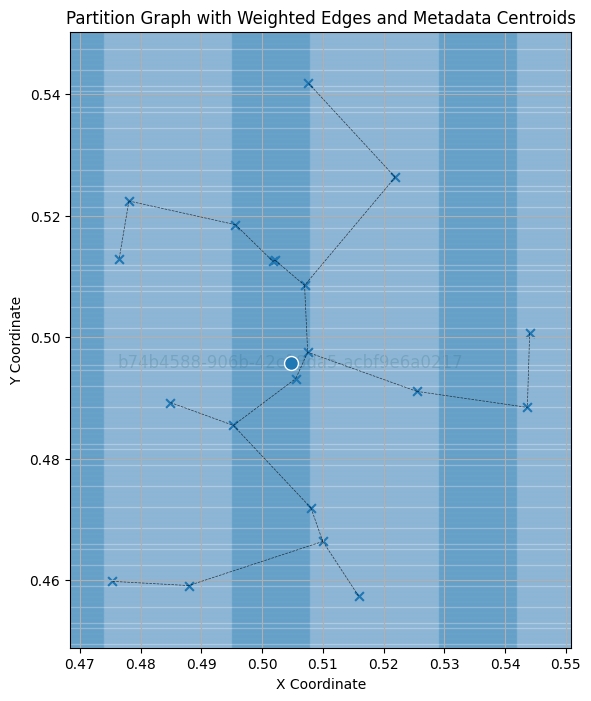

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

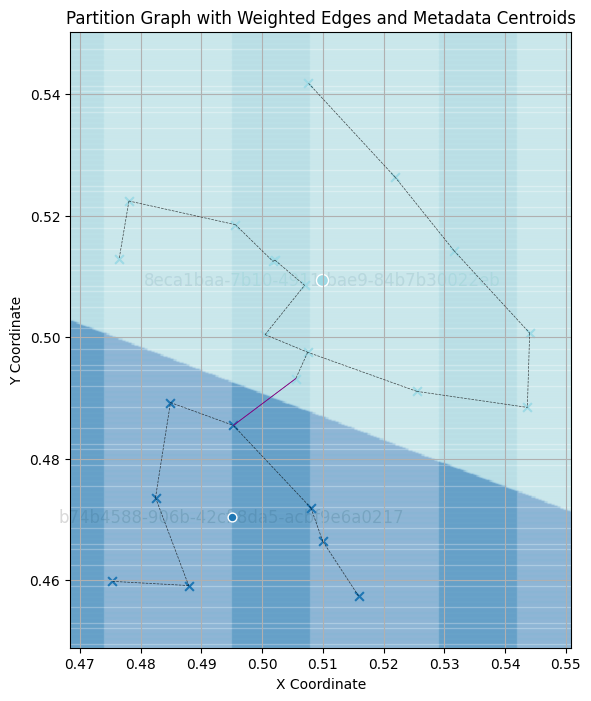

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

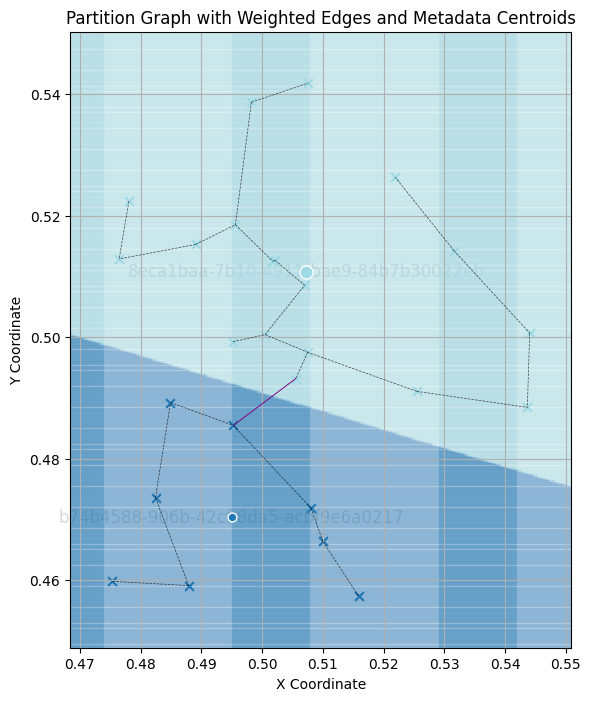

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

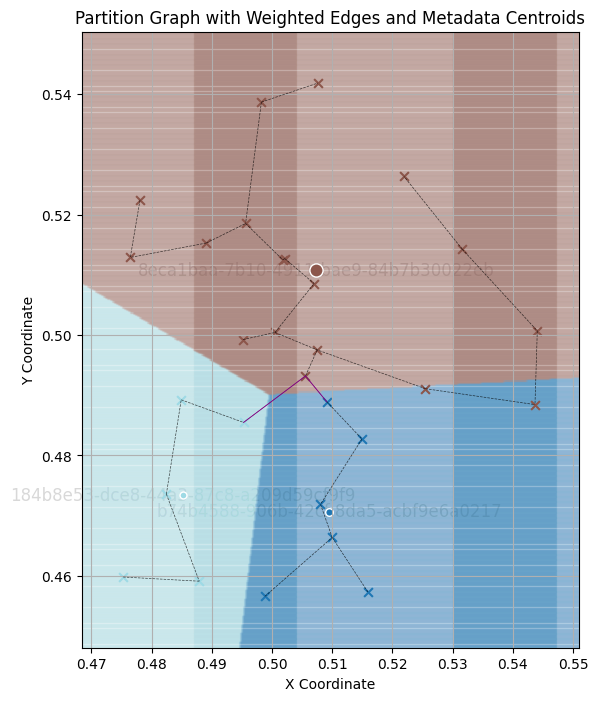

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

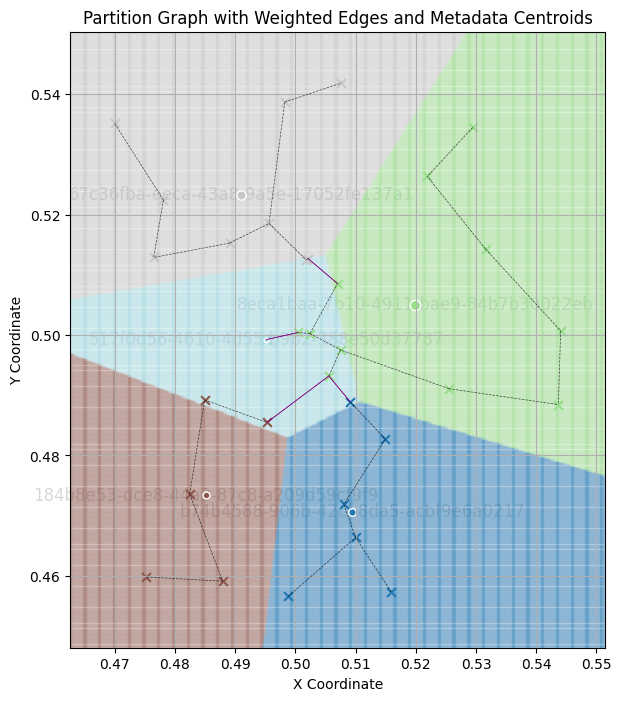

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

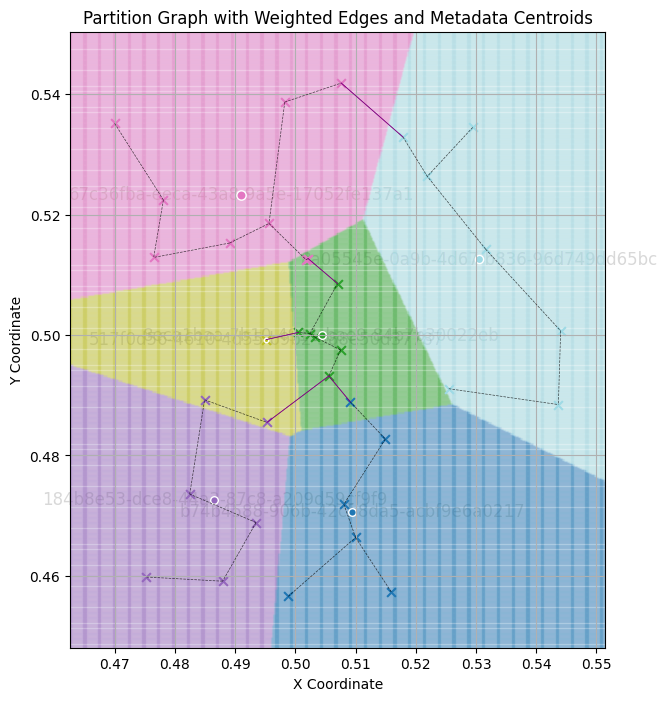

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

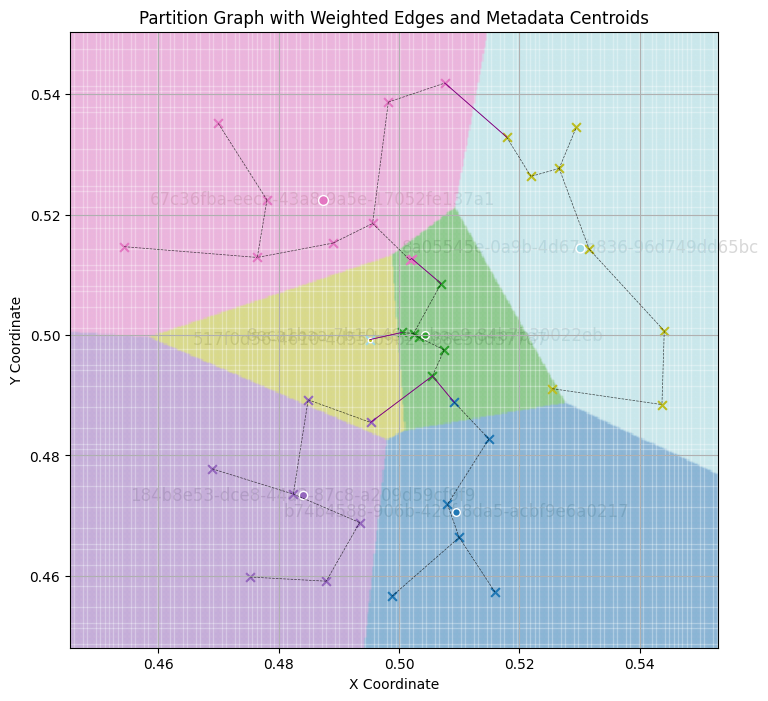

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

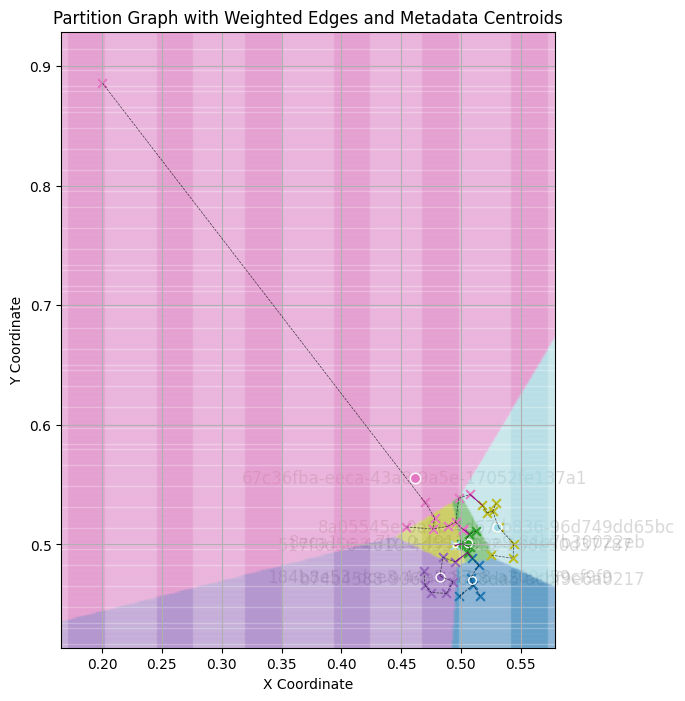

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

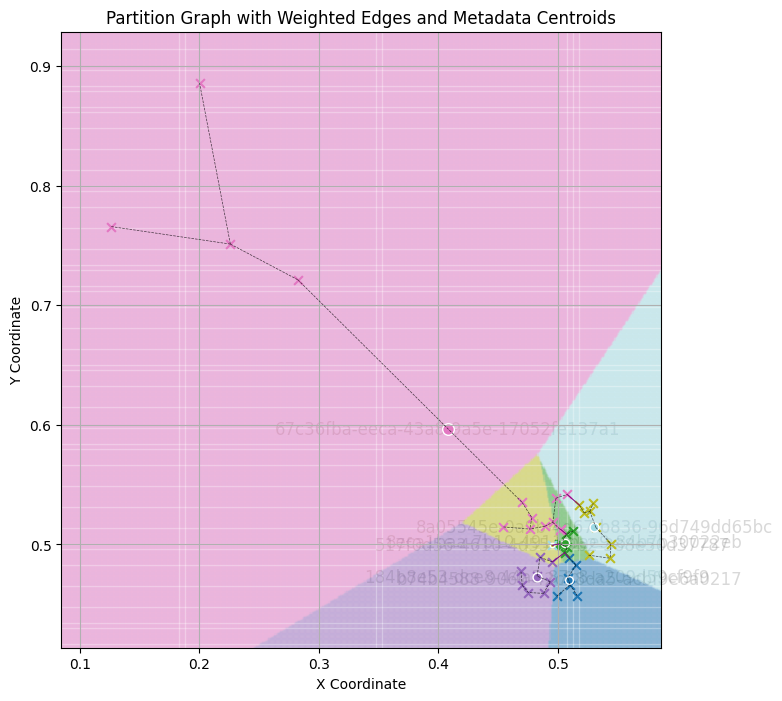

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

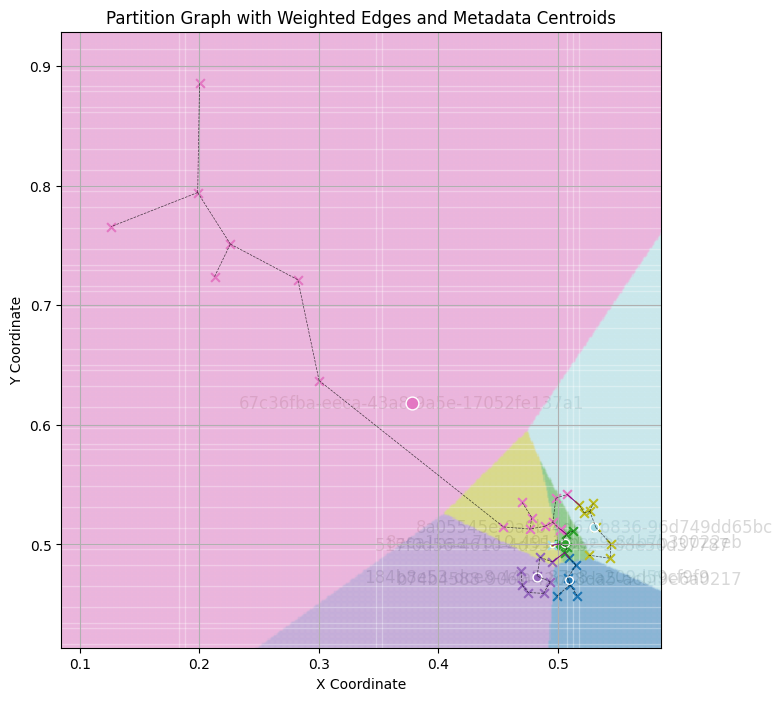

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

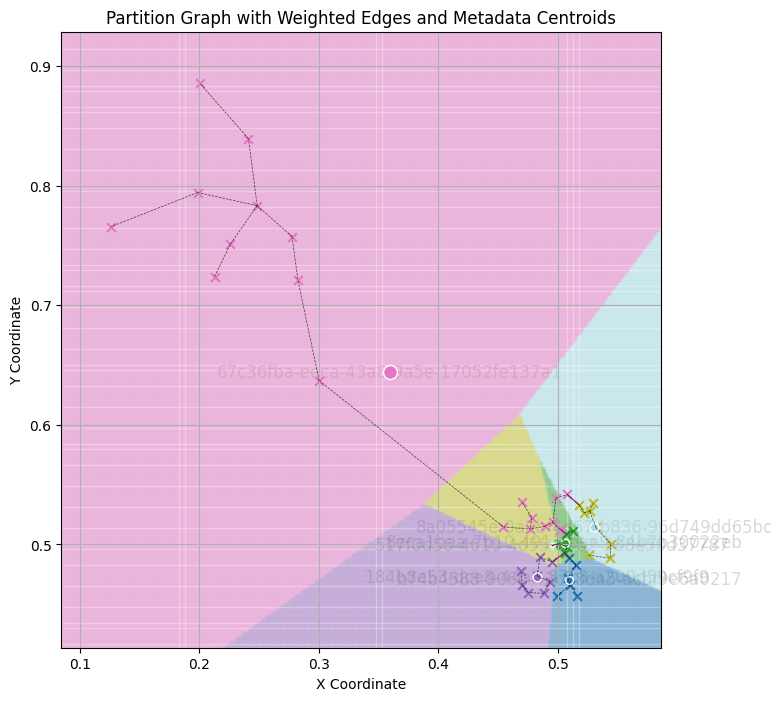

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

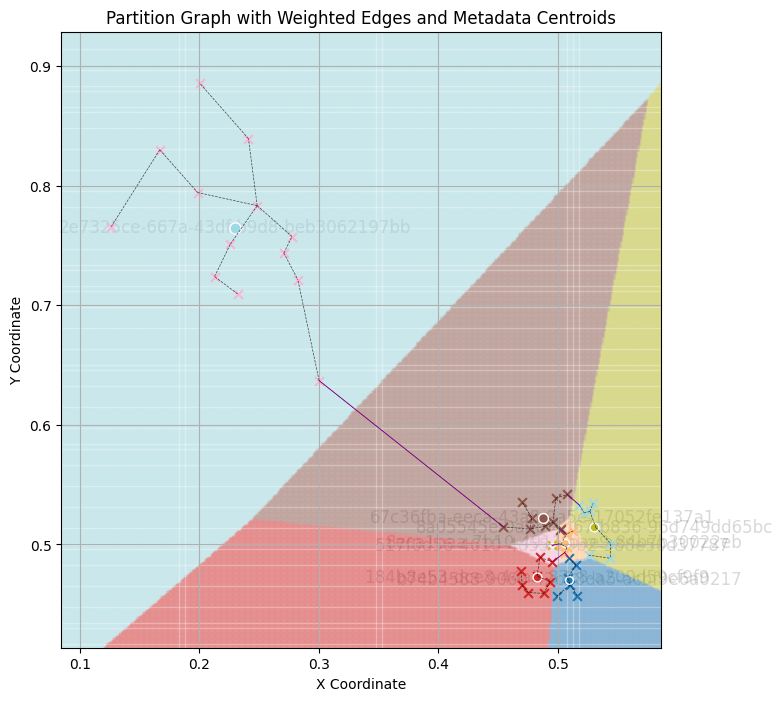

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

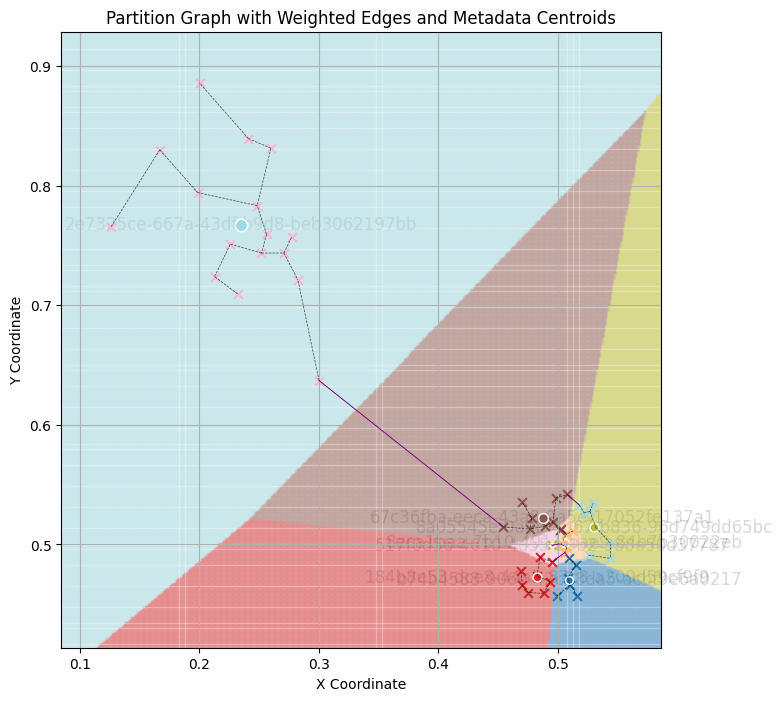

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

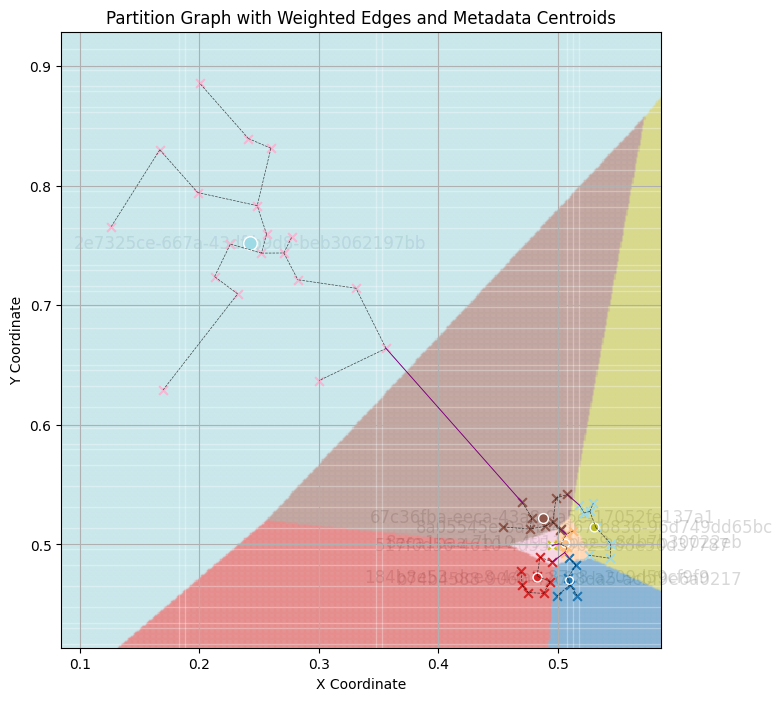

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

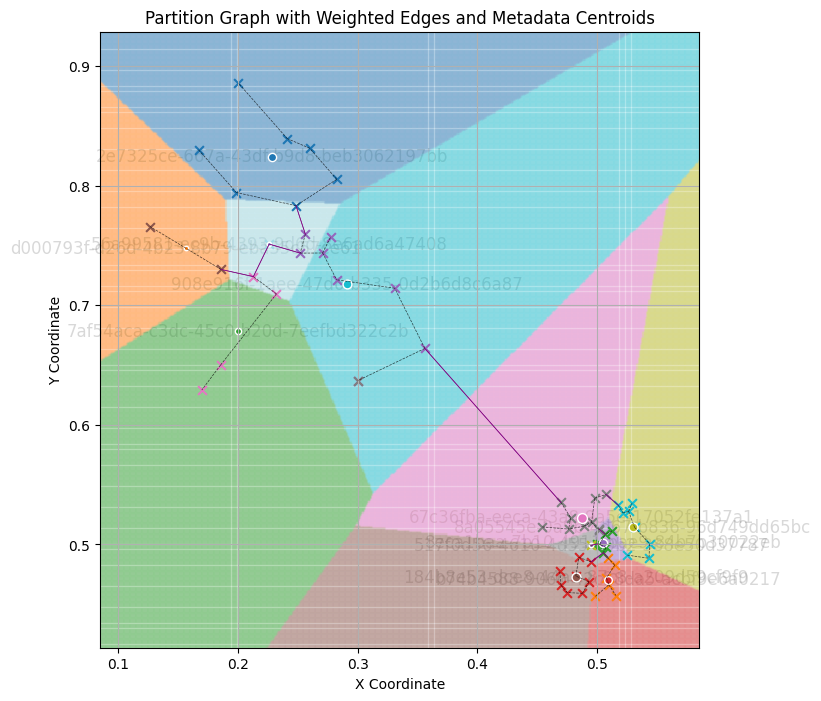

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

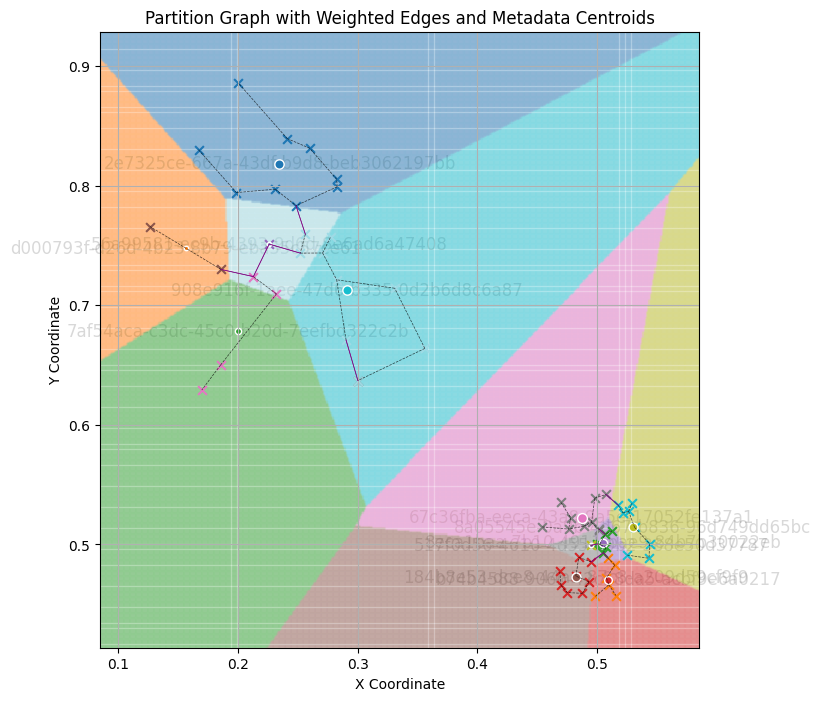

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

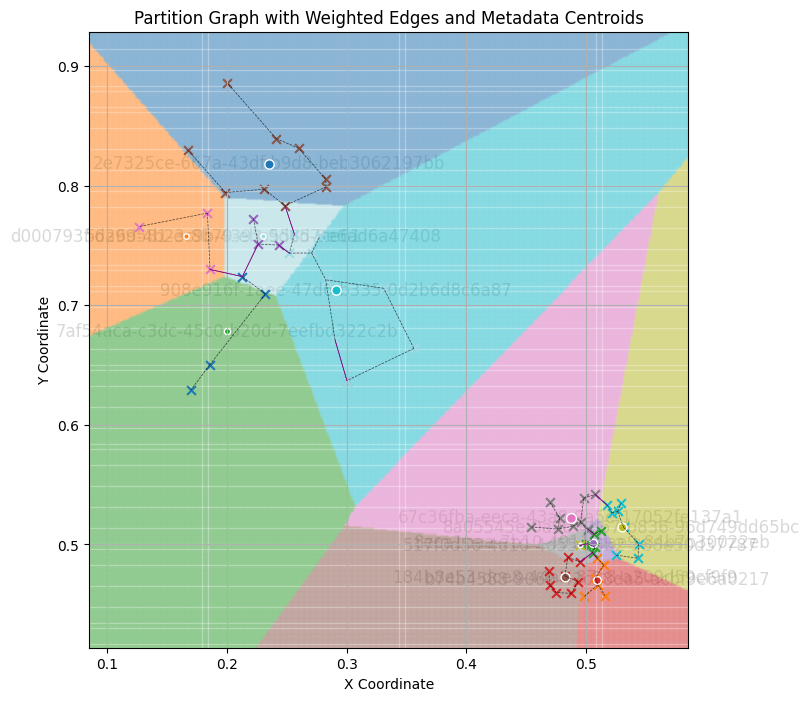

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

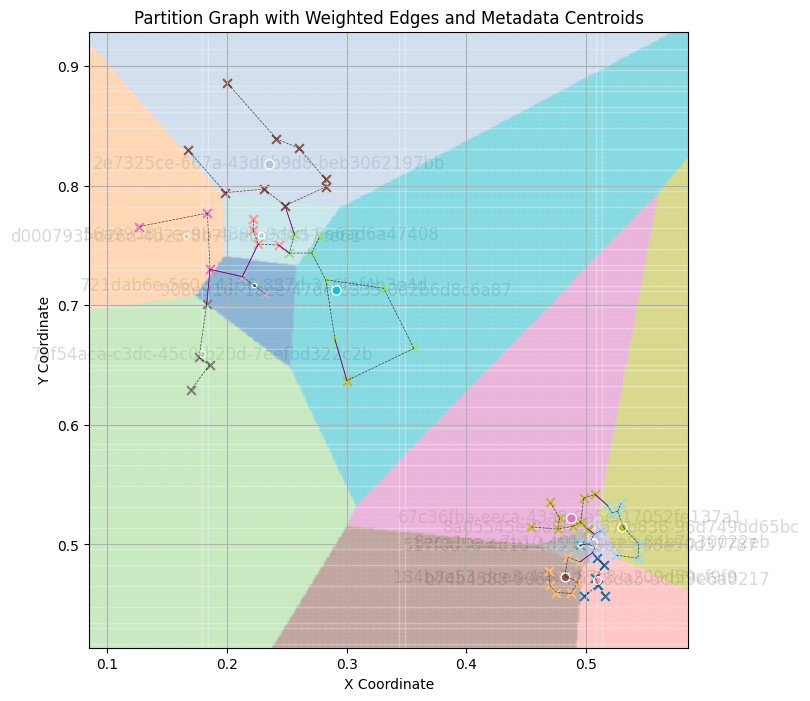

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

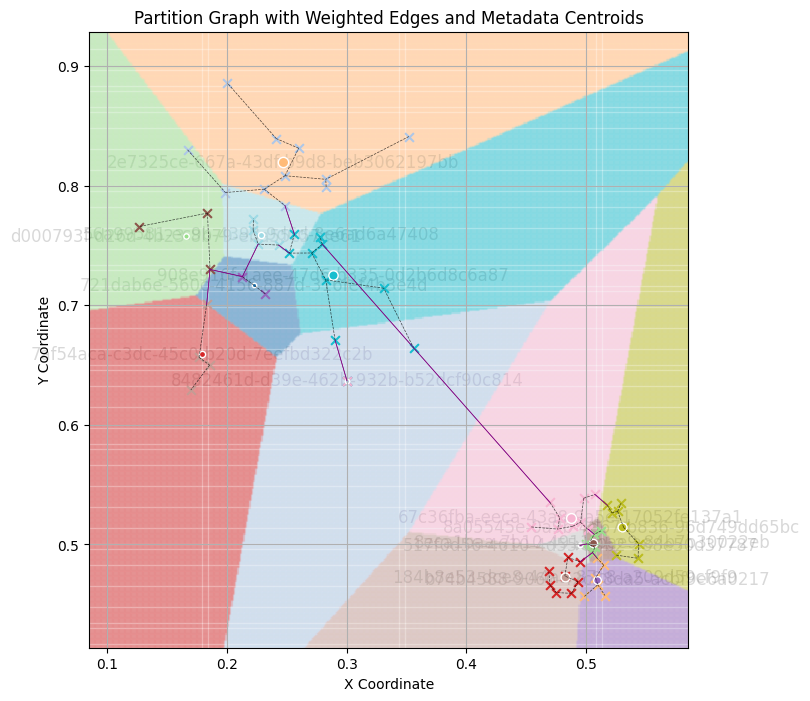

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

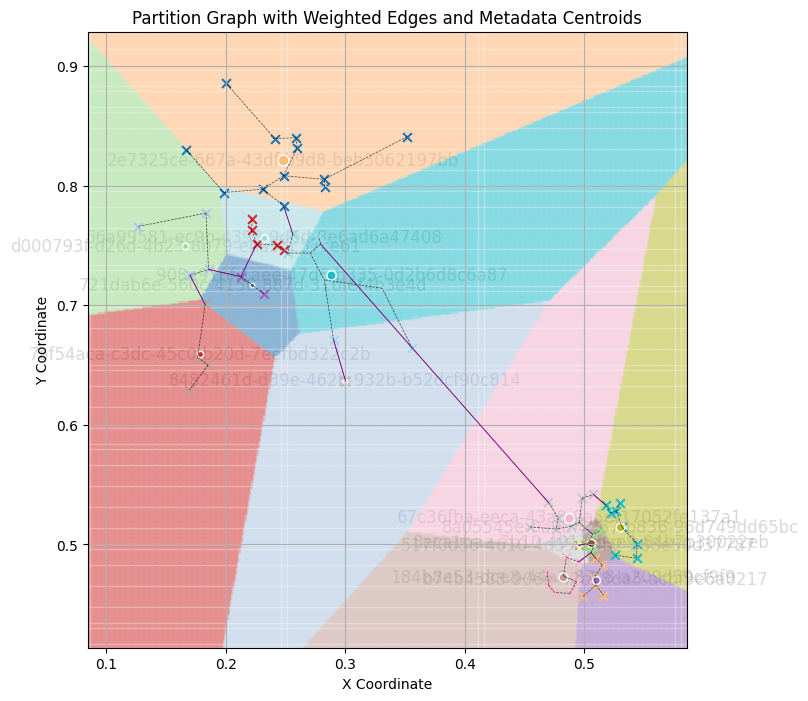

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

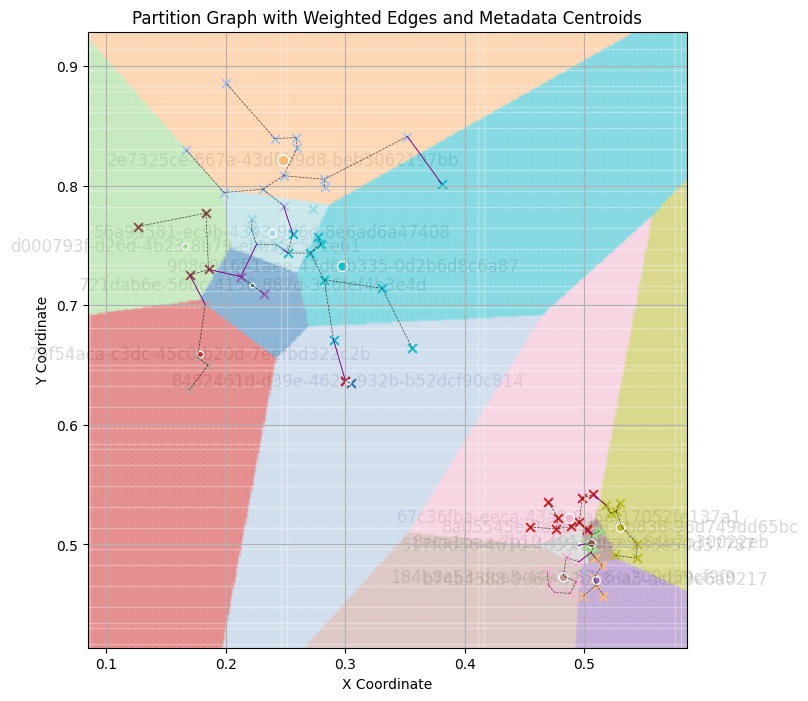

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

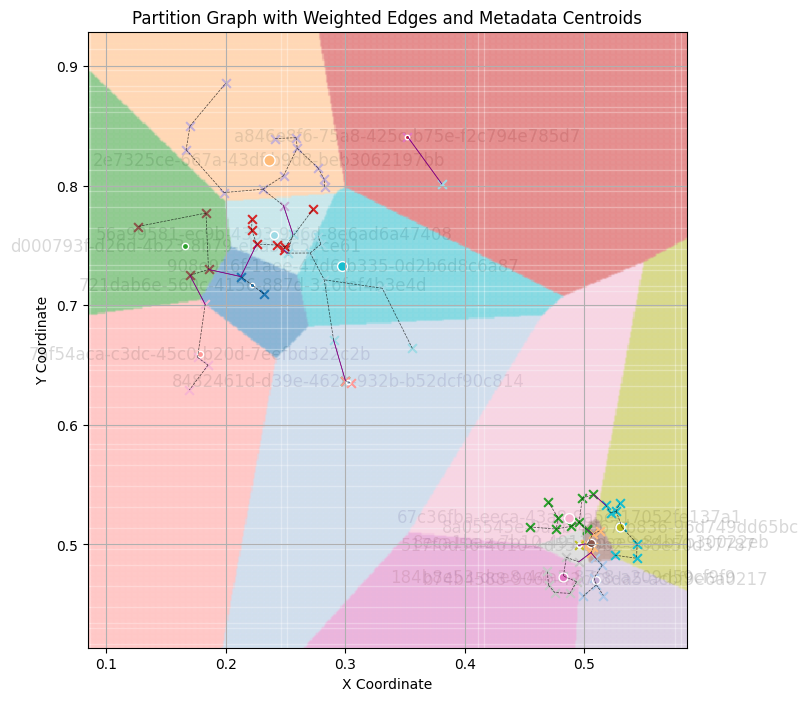

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

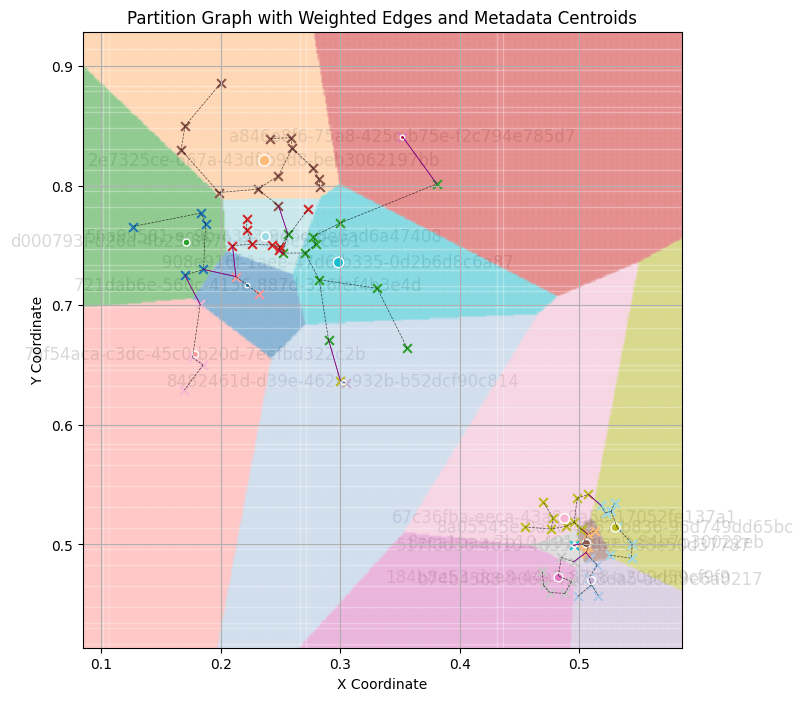

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

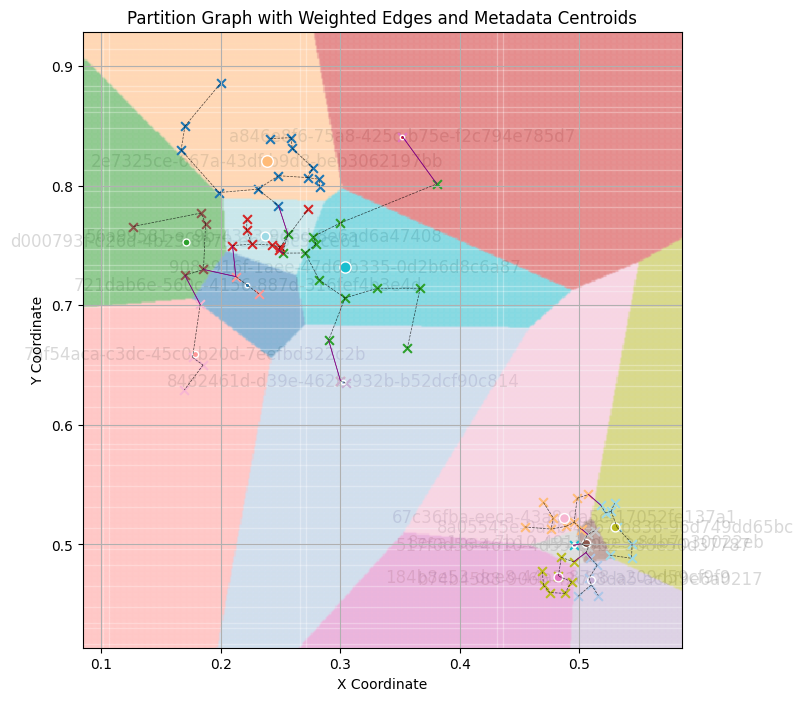

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

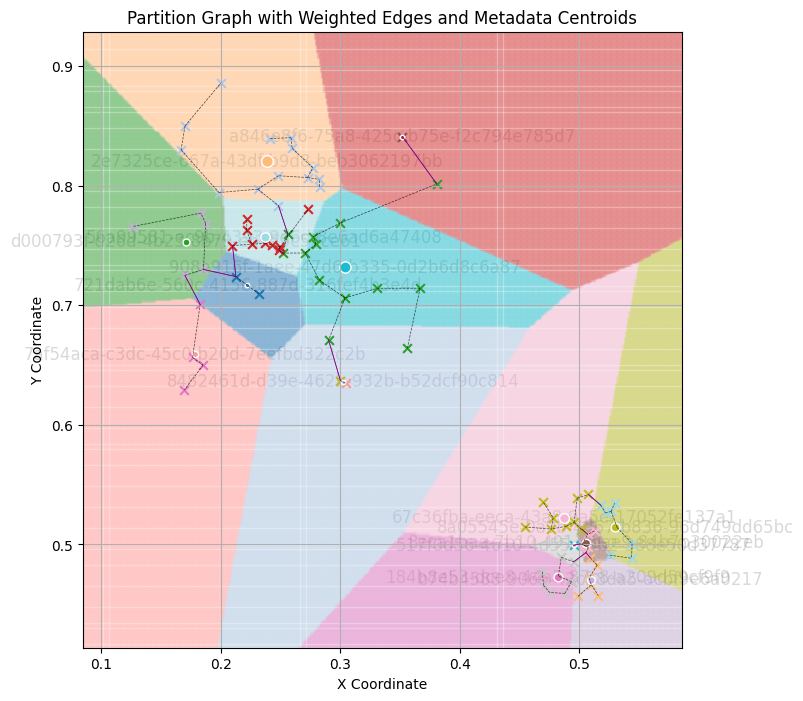

IndexError: list index out of range

Error in callback <function _draw_all_if_interactive at 0x00000246A0EEDBC0> (for post_execute), with arguments args (),kwargs {}:


TypeError: 'Figure' object is not iterable

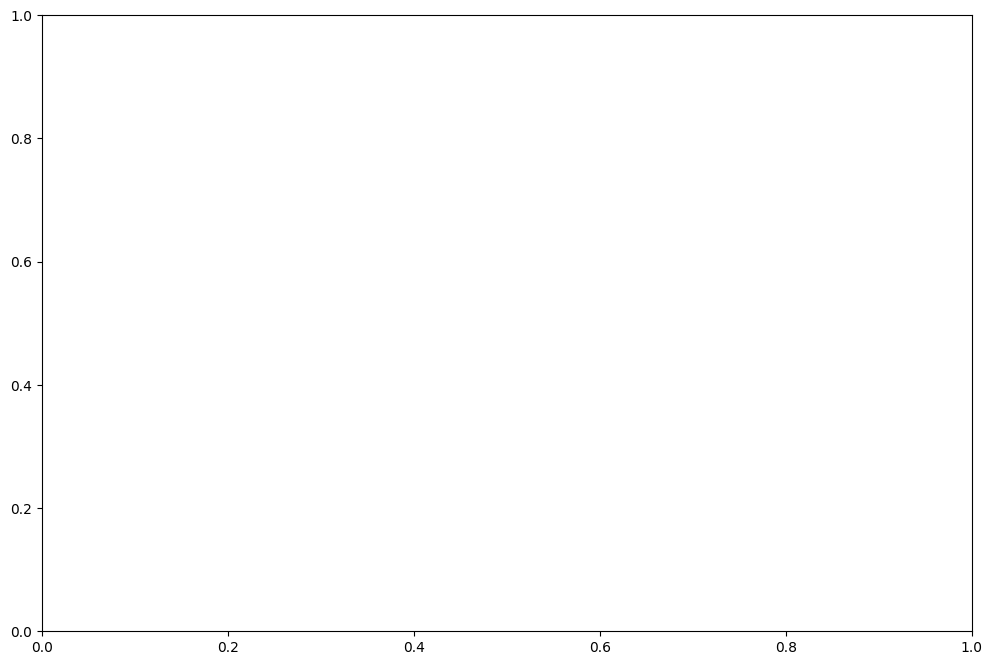

In [16]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.figure import Figure

batch = []
frames = []  # Store frames for the GIF

for i, vector in enumerate(vectors[:20]):
    batch.append({"vector": vector})  # Collect vectors in a batch

    # Send batch when it reaches size 10
    if len(batch) == 20:
        insert_batch_vector(batch)
        batch = []  # Reset the batch
        meta_data = get_metadata()
        partitions = get_vectors_by_partition(seq(meta_data).map(lambda x: x[0]).list())
        edges = seq(partitions).map(lambda x: get_edges_for_partition(x[0])).list()
        inter_edges = seq(partitions).map(lambda x: get_inter_edges_for_partition(x[0])).flatten().list()

        # Create a figure for the frame
        fig: Figure = plt.figure(figsize=(12, 8))
        plot_partition_graph(partitions, edges, meta_data, inter_edges)
        plt.close(fig)  # Close the plot to prevent displaying it during the loop
        frames.append(fig)
for i, vector in enumerate(vectors[20:]):
    batch.append({"vector": vector})  # Collect vectors in a batch

    # Send batch when it reaches size 10
    if len(batch) == 3:
        insert_batch_vector(batch)
        batch = []  # Reset the batch
        meta_data = get_metadata()
        partitions = get_vectors_by_partition(seq(meta_data).map(lambda x: x[0]).list())
        edges = seq(partitions).map(lambda x: get_edges_for_partition(x[0])).list()
        inter_edges = seq(partitions).map(lambda x: get_inter_edges_for_partition(x[0])).flatten().list()

        # Create a figure for the frame
        fig: Figure = plt.figure(figsize=(12, 8))
        plot_partition_graph(partitions, edges, meta_data, inter_edges)
        plt.close(fig)  # Close the plot to prevent displaying it during the loop
        frames.append(fig)

# Insert any remaining vectors in the final batch
if batch:
    insert_batch_vector(batch)
    meta_data = get_metadata()
    partitions = get_vectors_by_partition(seq(meta_data).map(lambda x: x[0]).list())
    edges = seq(partitions).map(lambda x: get_edges_for_partition(x[0])).list()
    inter_edges = seq(partitions).map(lambda x: get_inter_edges_for_partition(x[0])).flatten().list()

    # Create a figure for the final frame
    fig: Figure = plt.figure(figsize=(12, 8))
    plot_partition_graph(partitions, edges, meta_data, inter_edges)
    plt.close(fig)
    frames.append(fig)

# Create an animation and save it as a GIF
fig, ax = plt.subplots(figsize=(12, 8))
def update_frame(i):
    ax.clear()
    plot_partition_graph(partitions, edges, meta_data, inter_edges)

ani = animation.ArtistAnimation(fig, frames, interval=500, repeat_delay=1000)
ani.save('partition_graph_animation.gif', writer='pillow')


In [79]:
vectors[20]

[0.5036588509613689, 0.5413292489263289]

Response from '/insert': Vector received


C:\Users\hasin\AppData\Local\Temp\ipykernel_39764\614914634.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', num_partitions)
C:\Users\hasin\AppData\Local\Temp\ipykernel_39764\614914634.py:64: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
C:\Users\hasin\AppData\Local\Temp\ipykernel_39764\614914634.py:118: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  plt.xlim(x_min, x_max)
C:\Users\hasin\AppData\Local\Temp\ipykernel_39764\614914634.py:119: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.


<Figure size 1200x800 with 0 Axes>

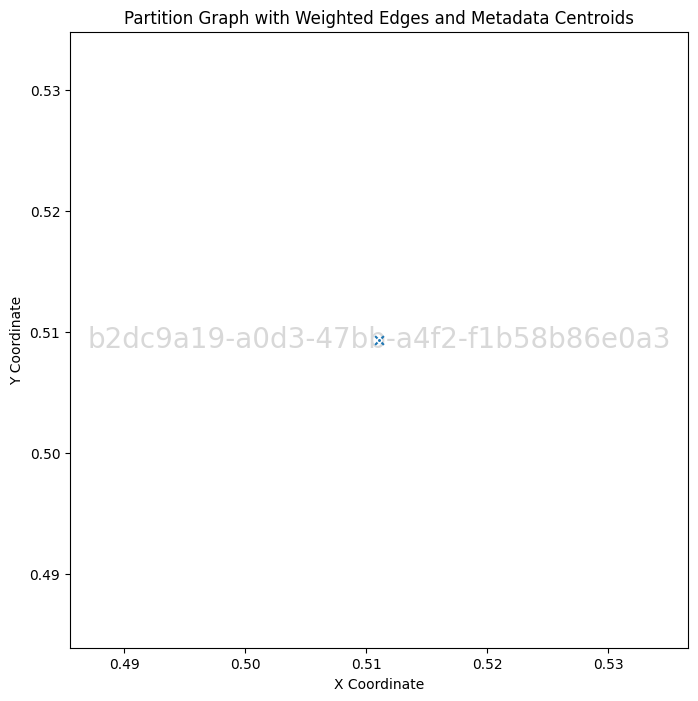

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

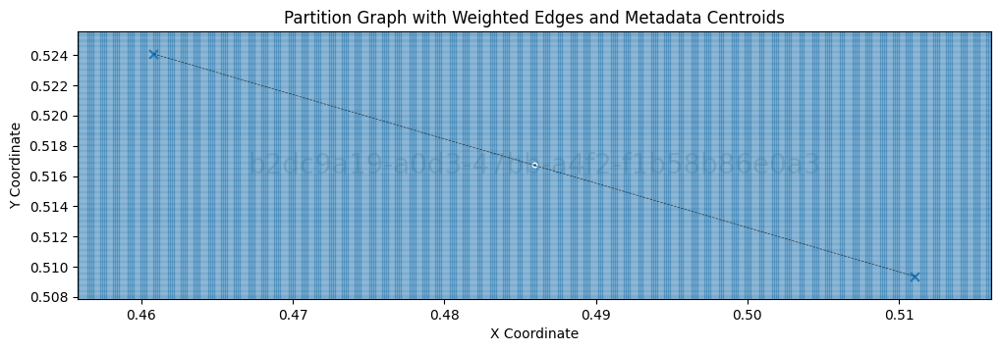

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

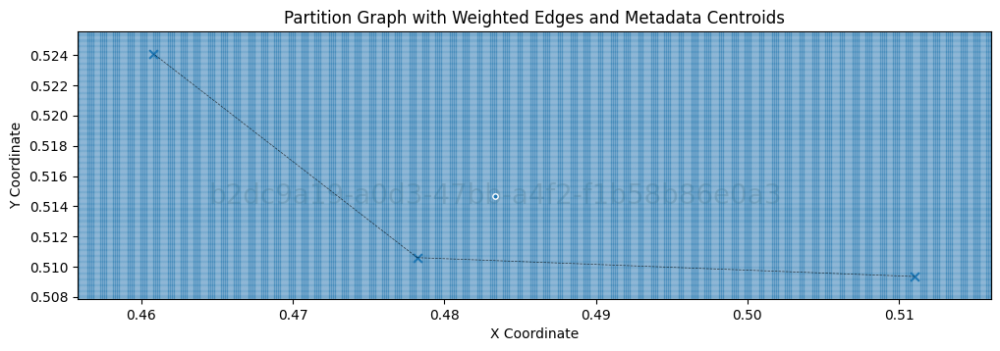

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

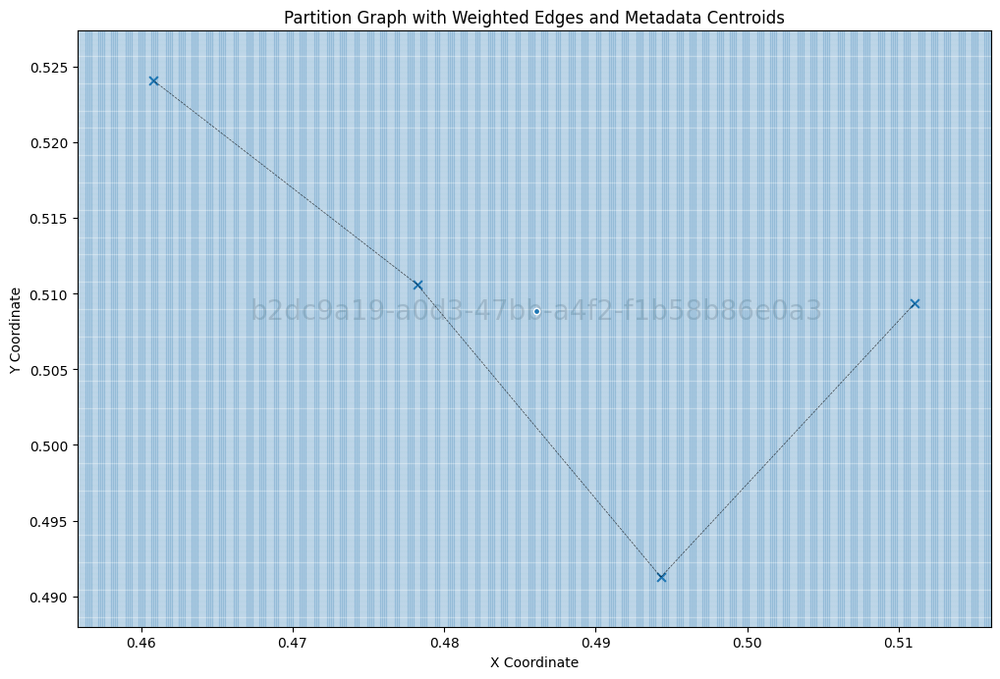

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

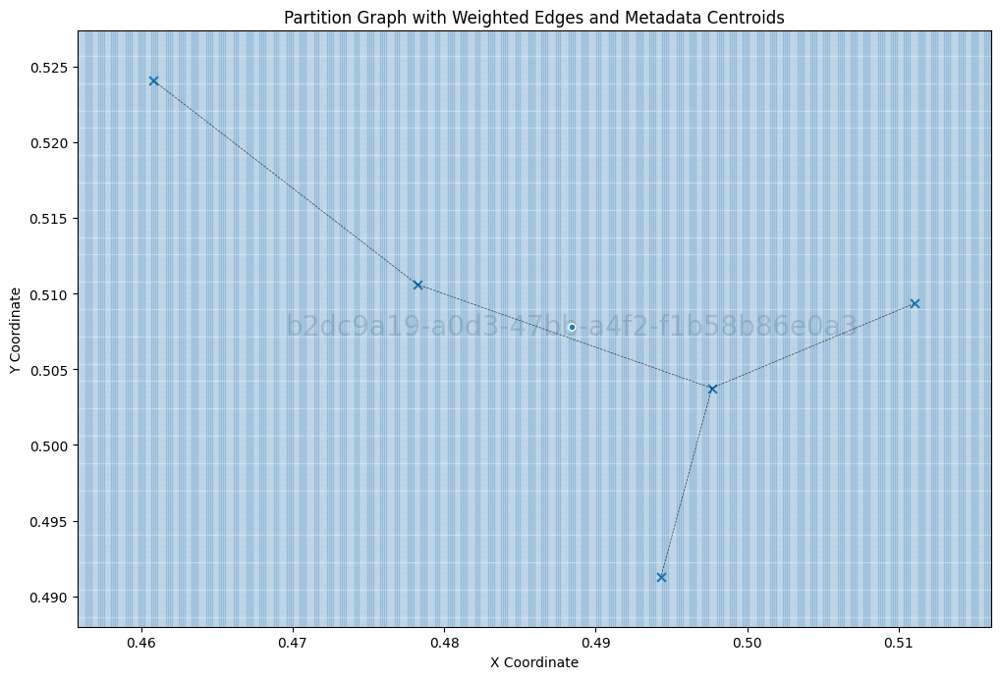

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

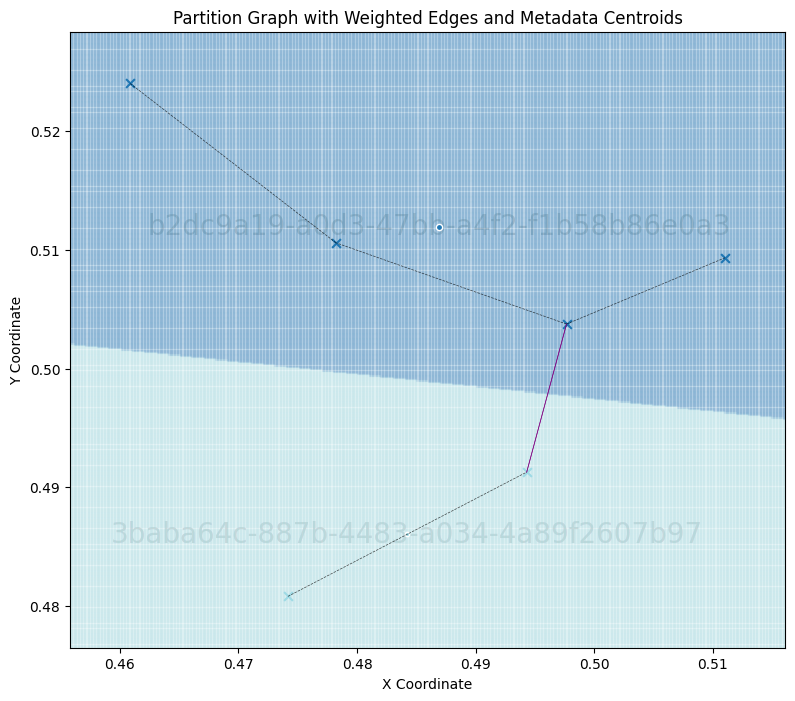

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

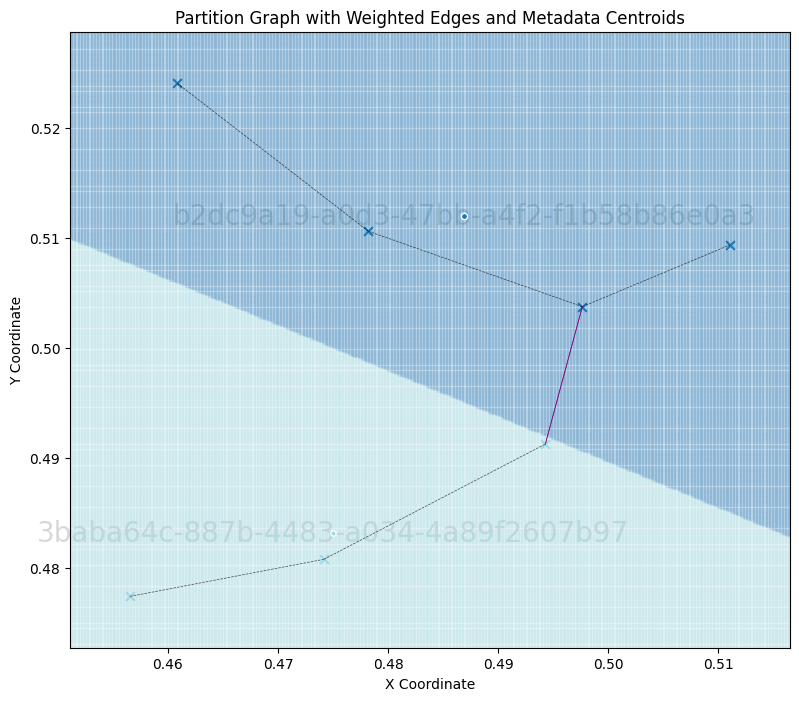

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

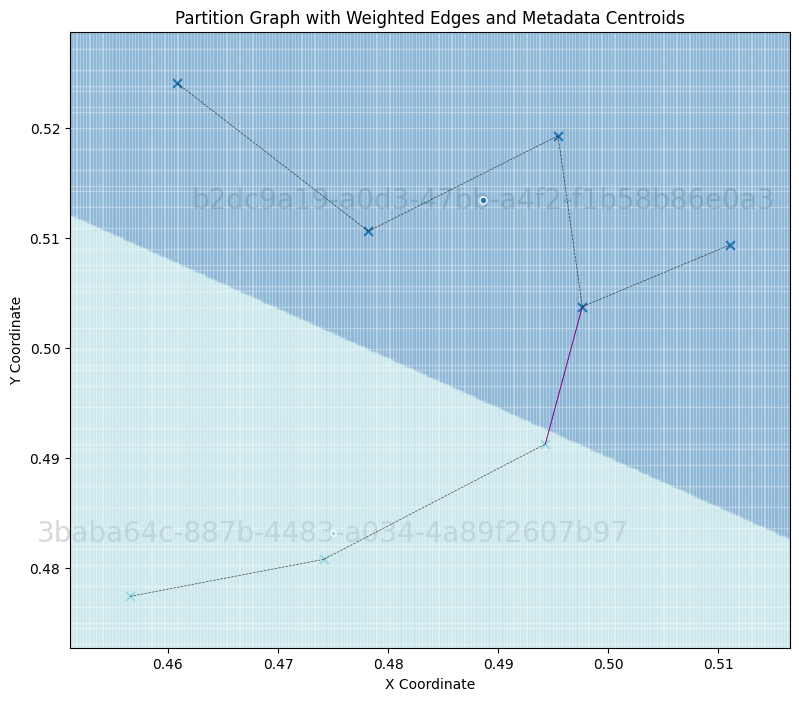

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

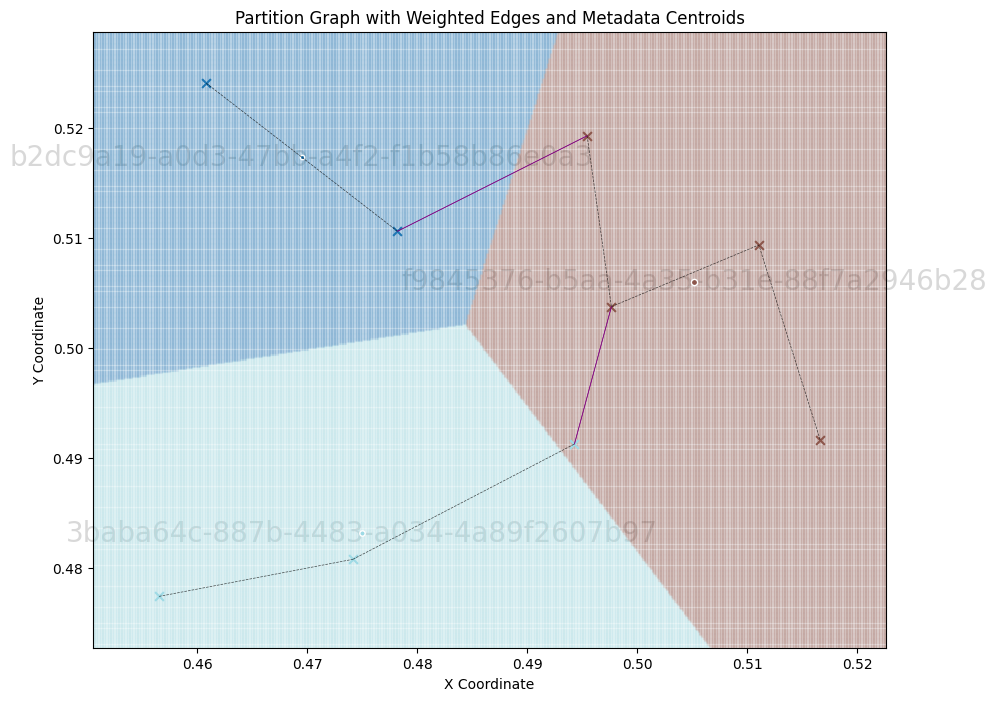

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

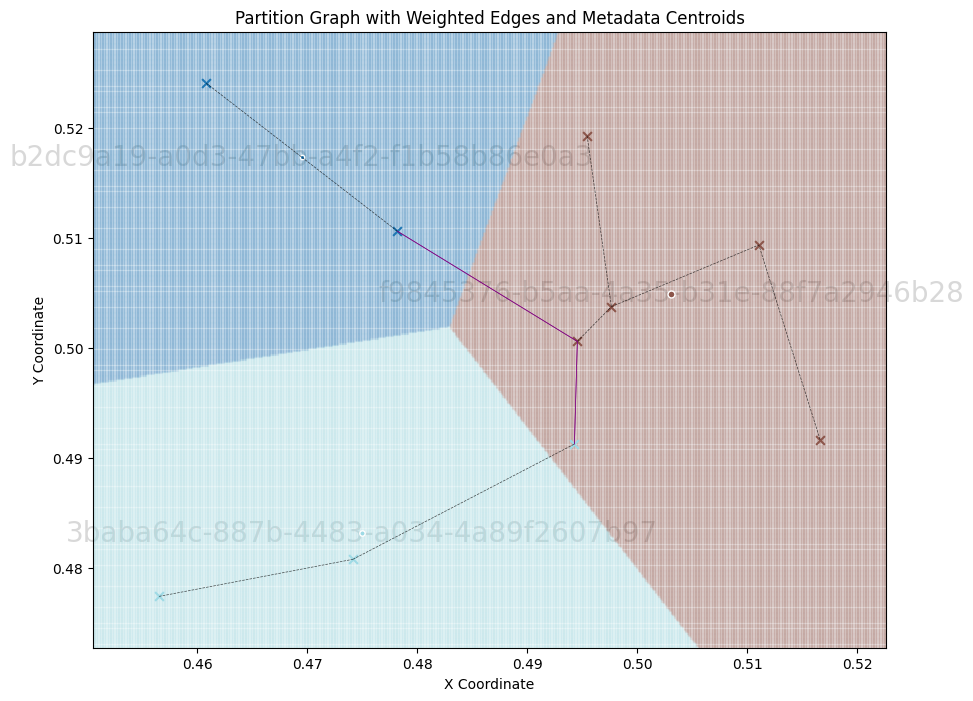

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

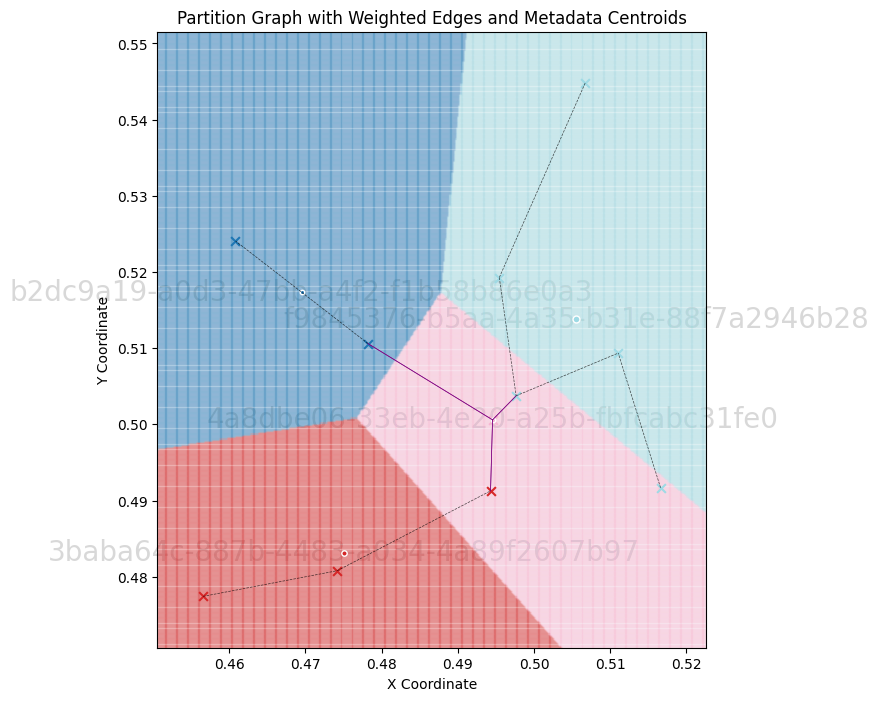

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

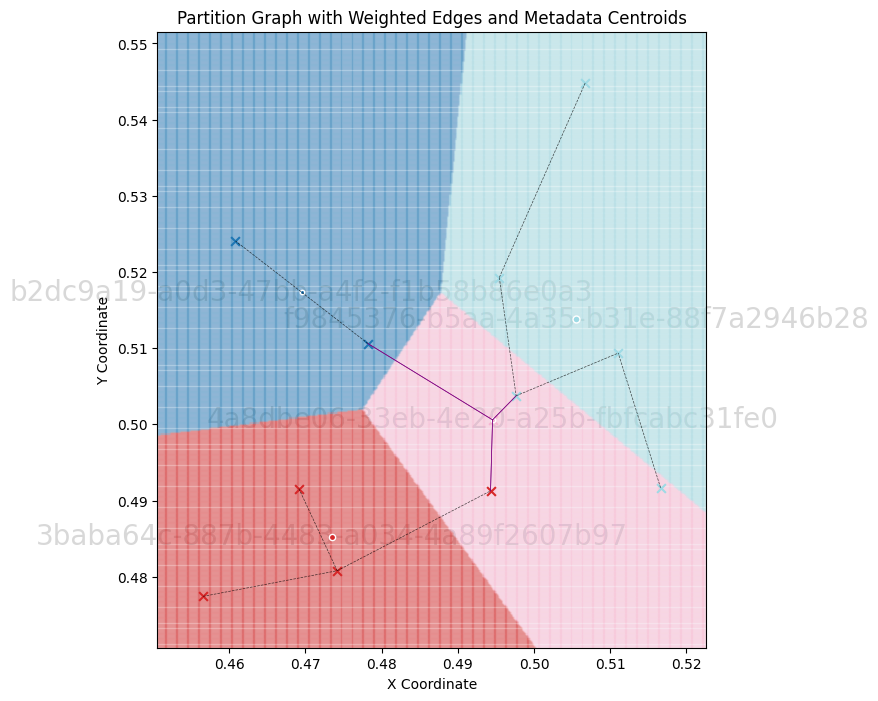

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

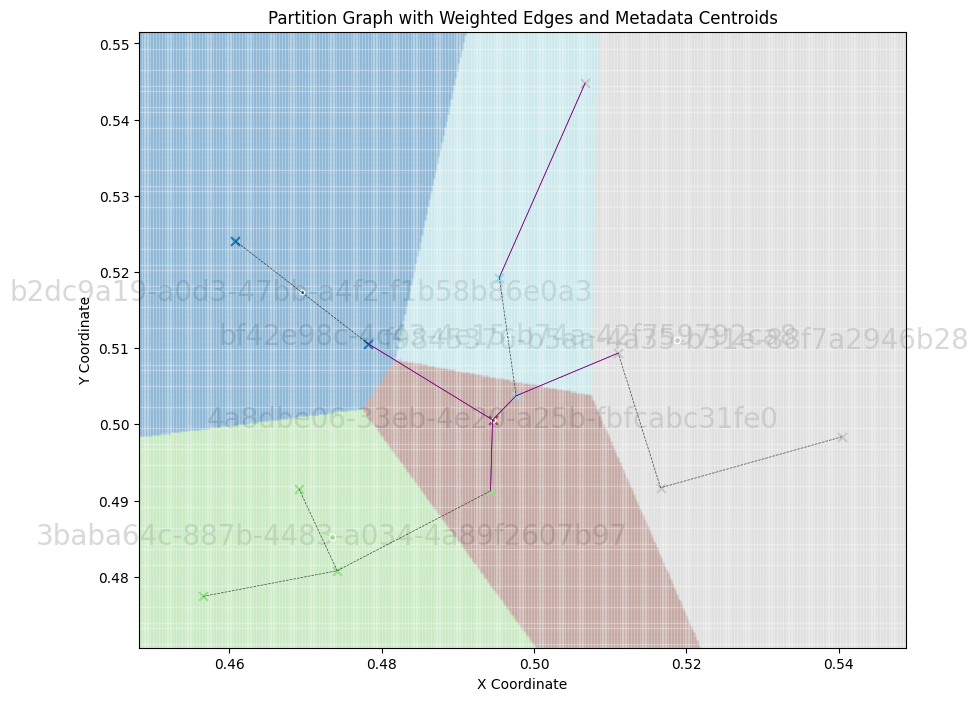

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

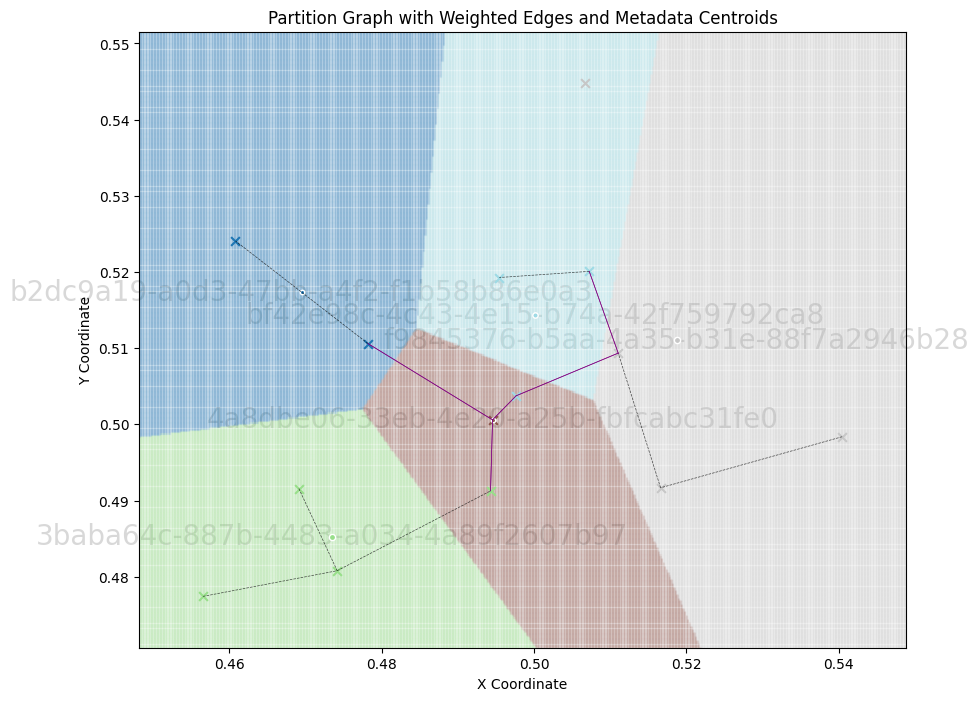

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

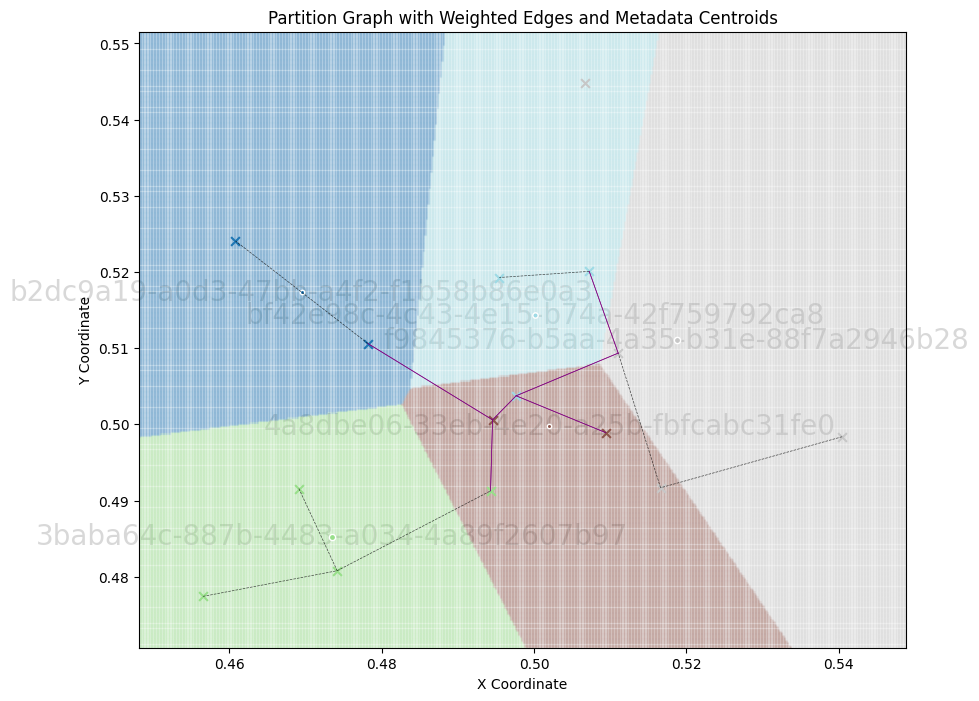

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

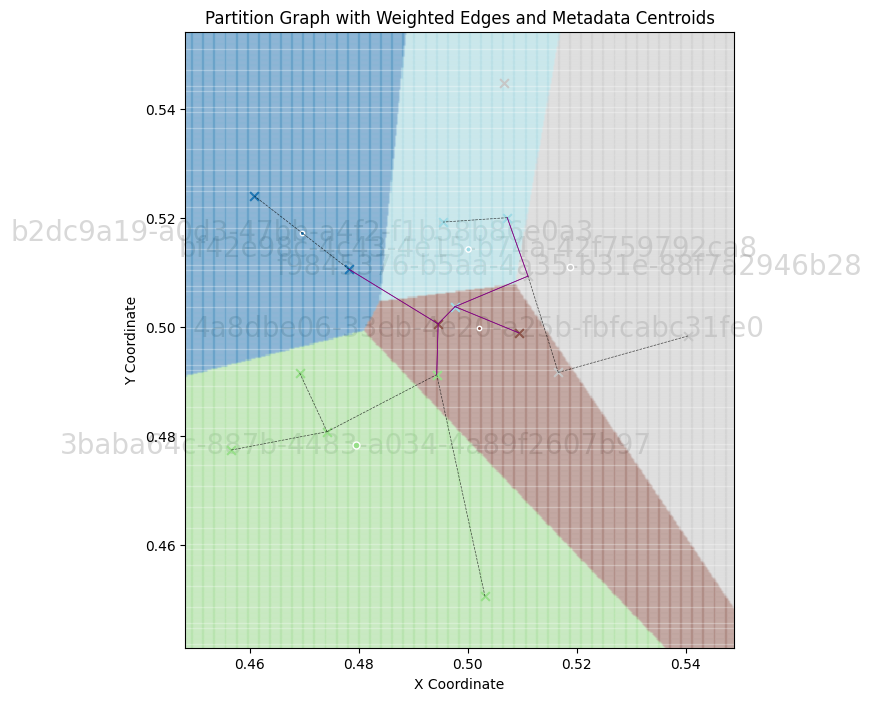

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

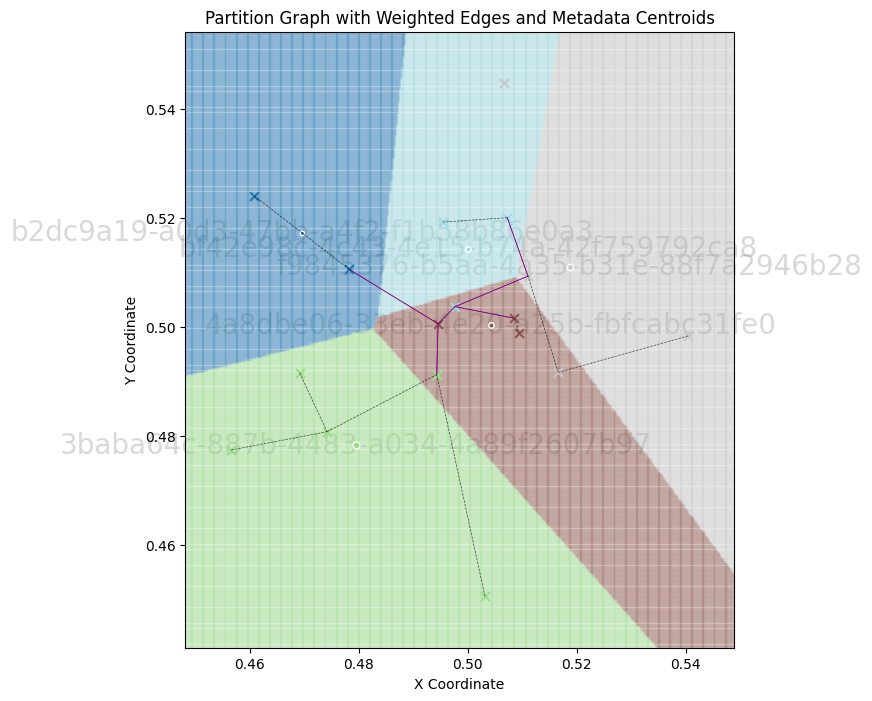

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

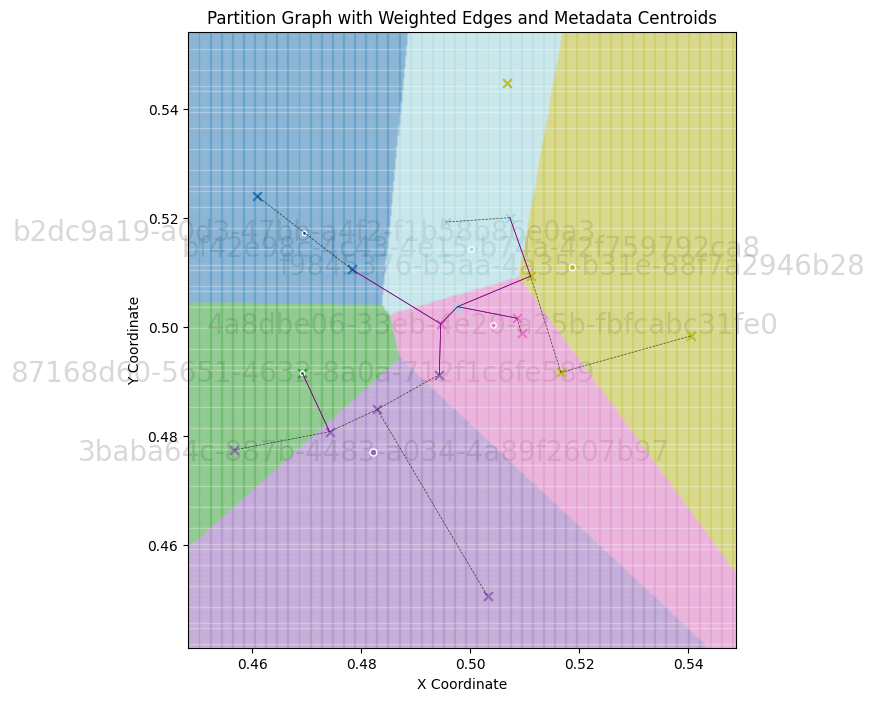

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

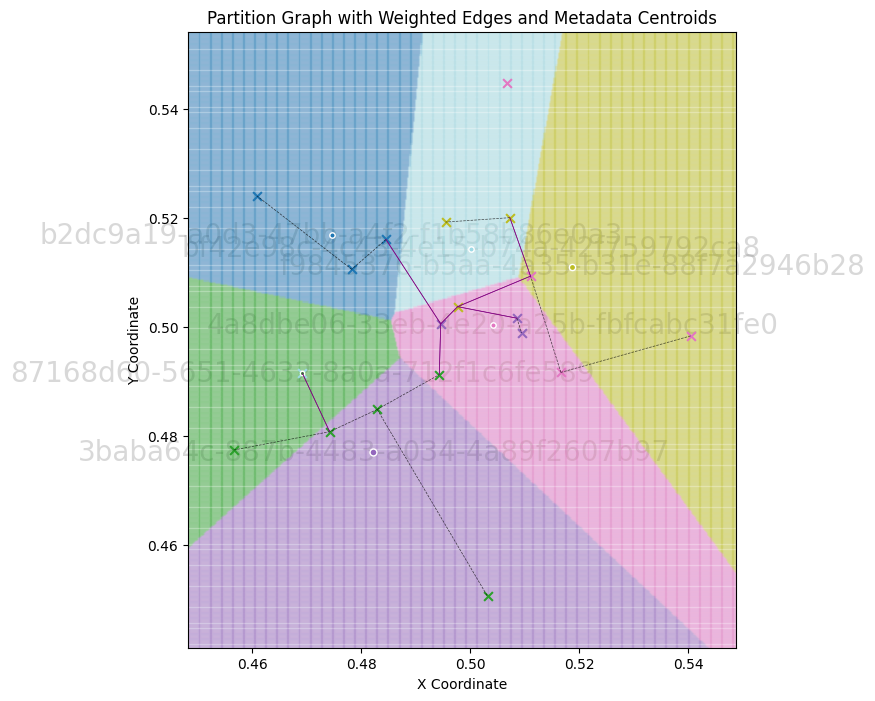

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

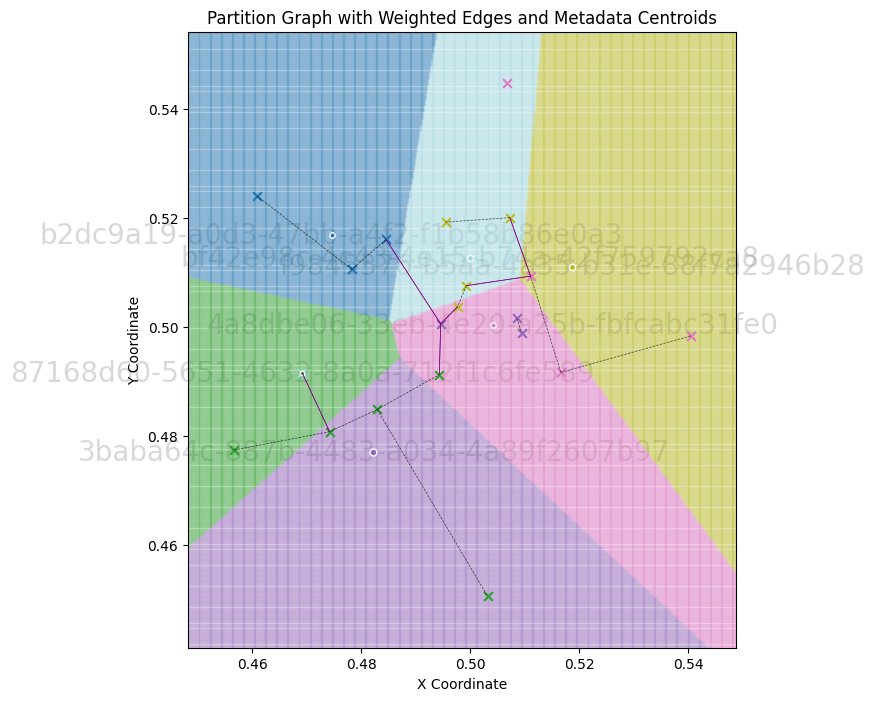

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

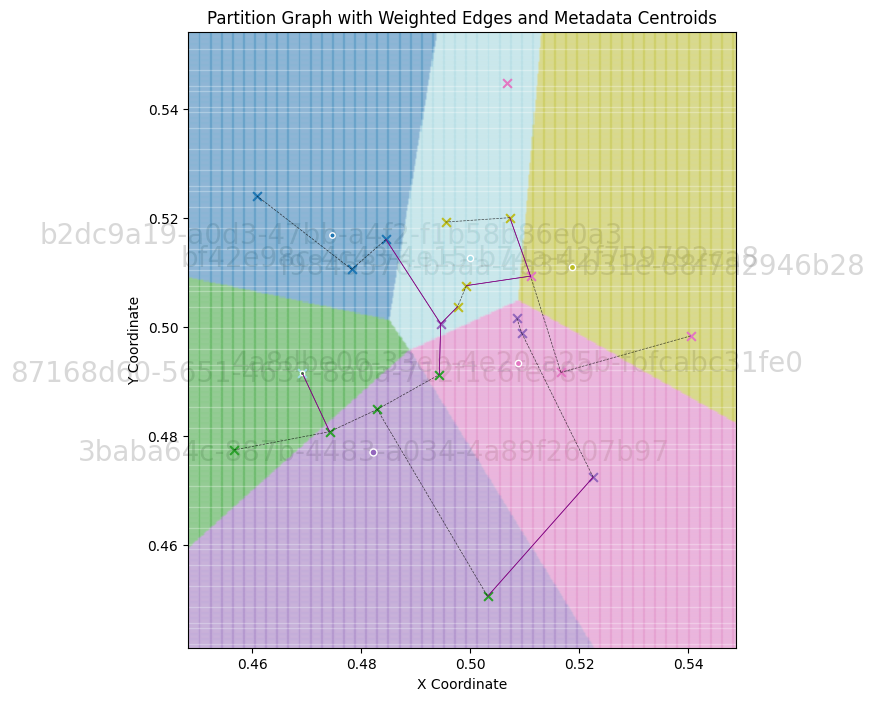

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

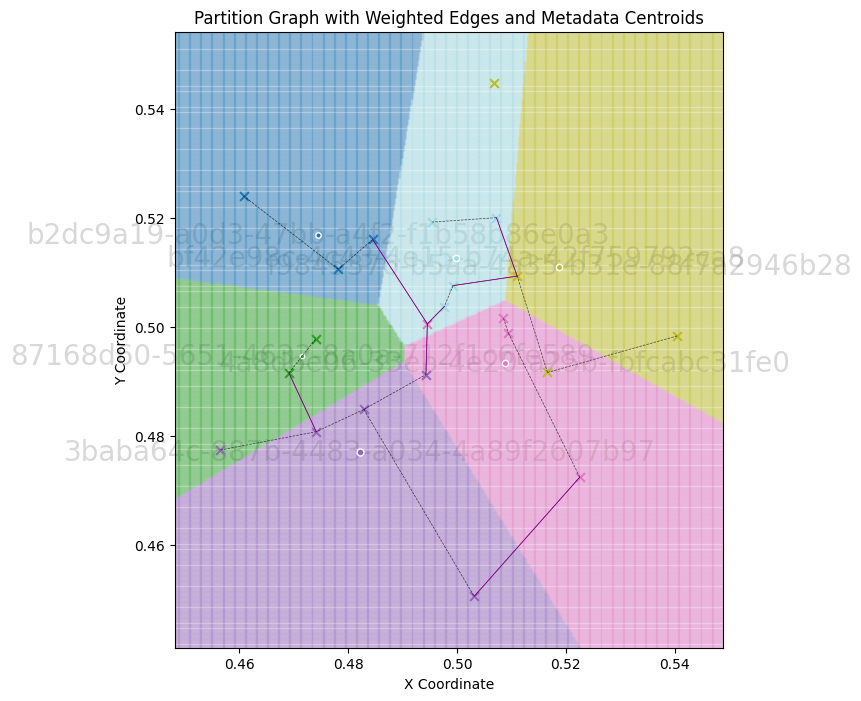

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

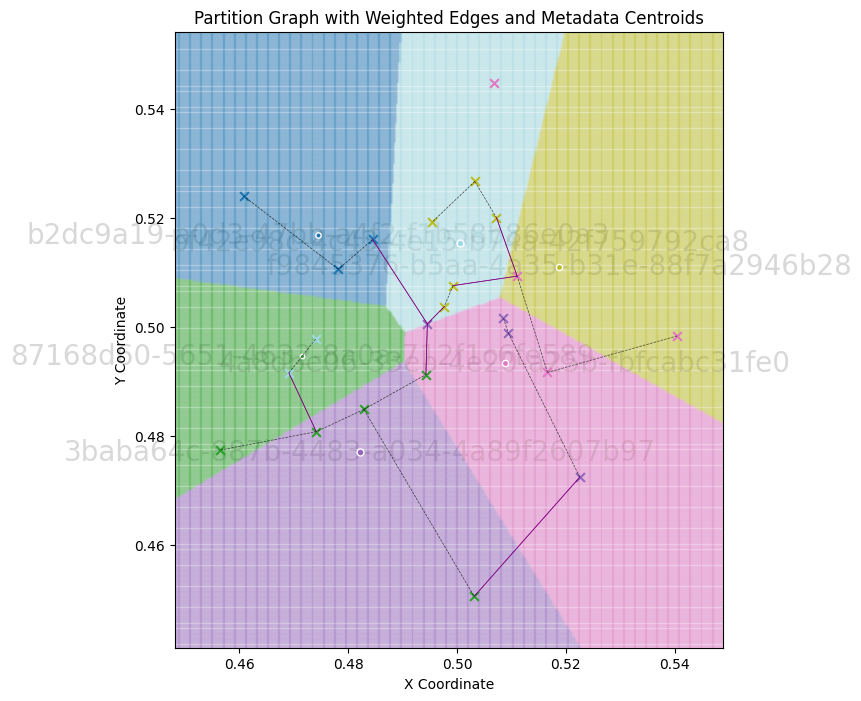

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

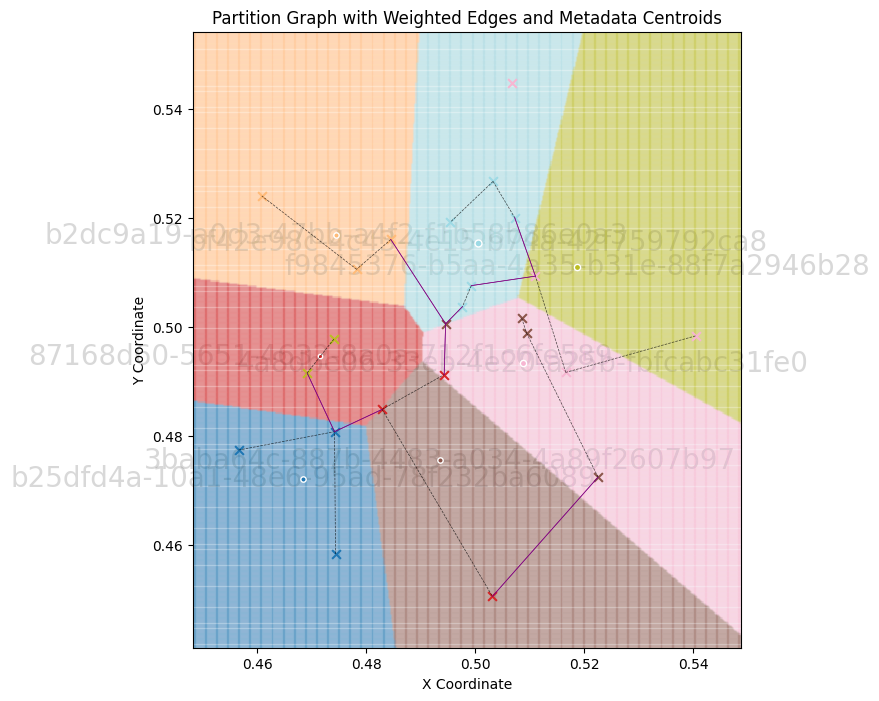

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

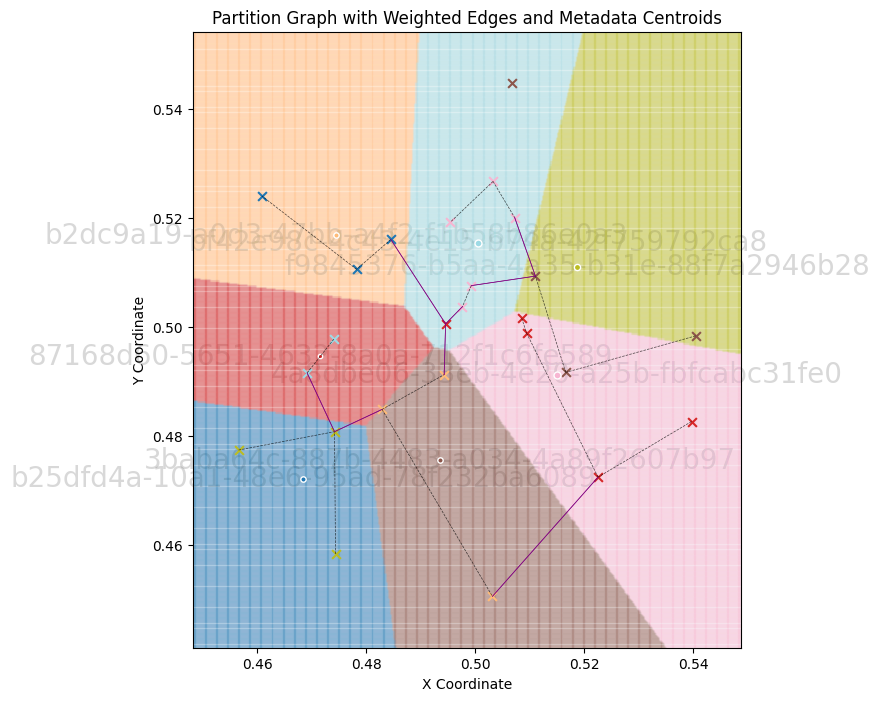

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

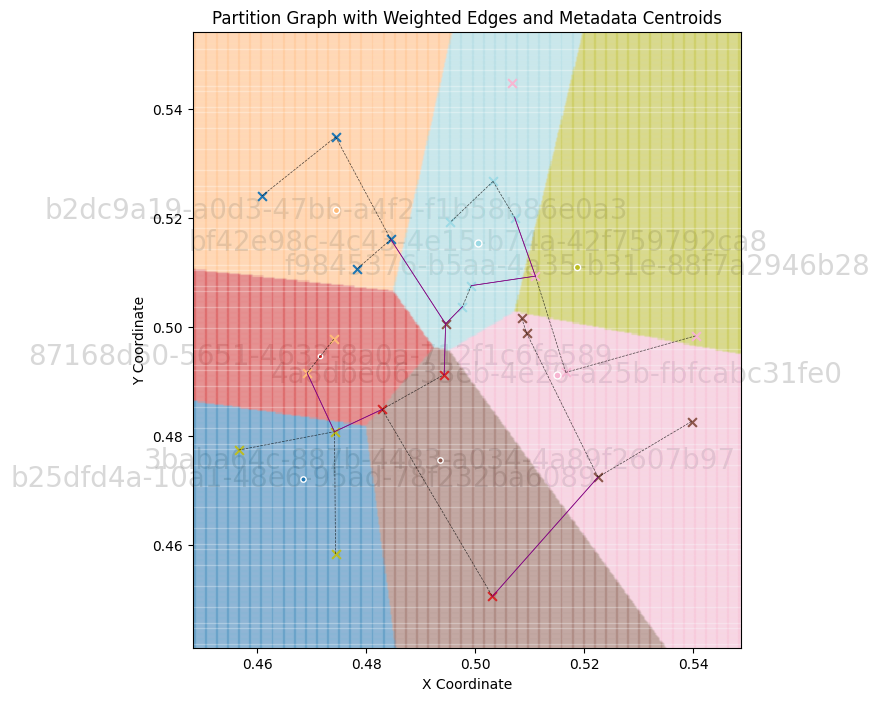

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

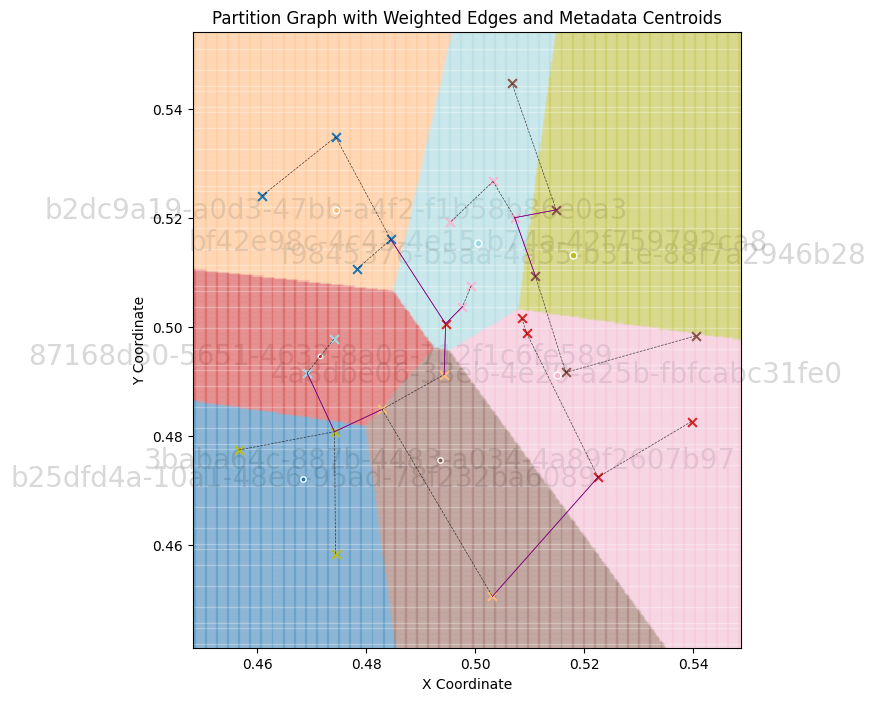

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

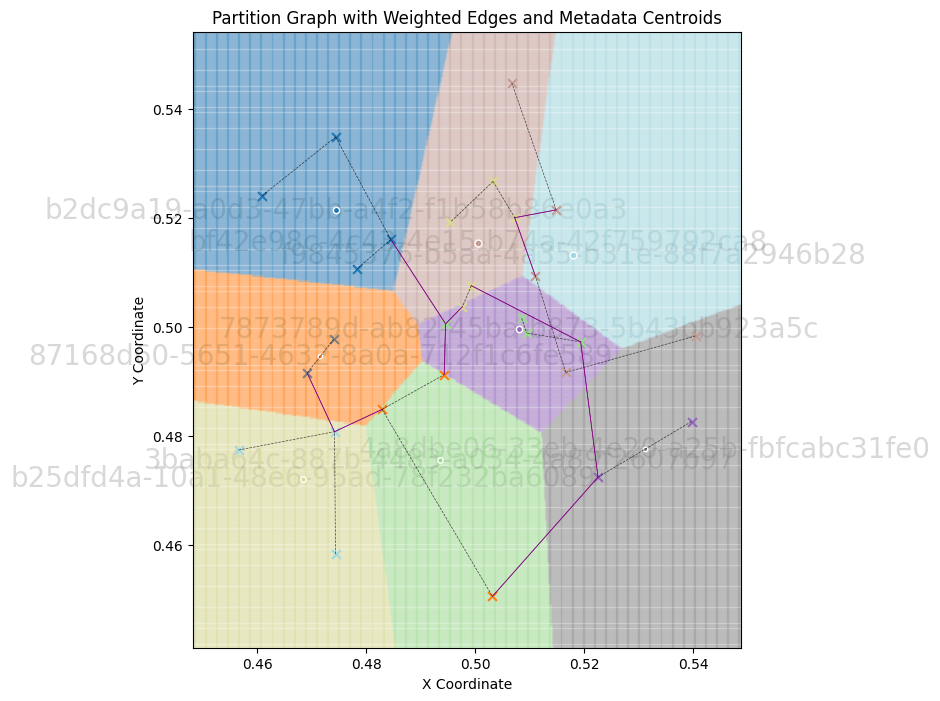

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

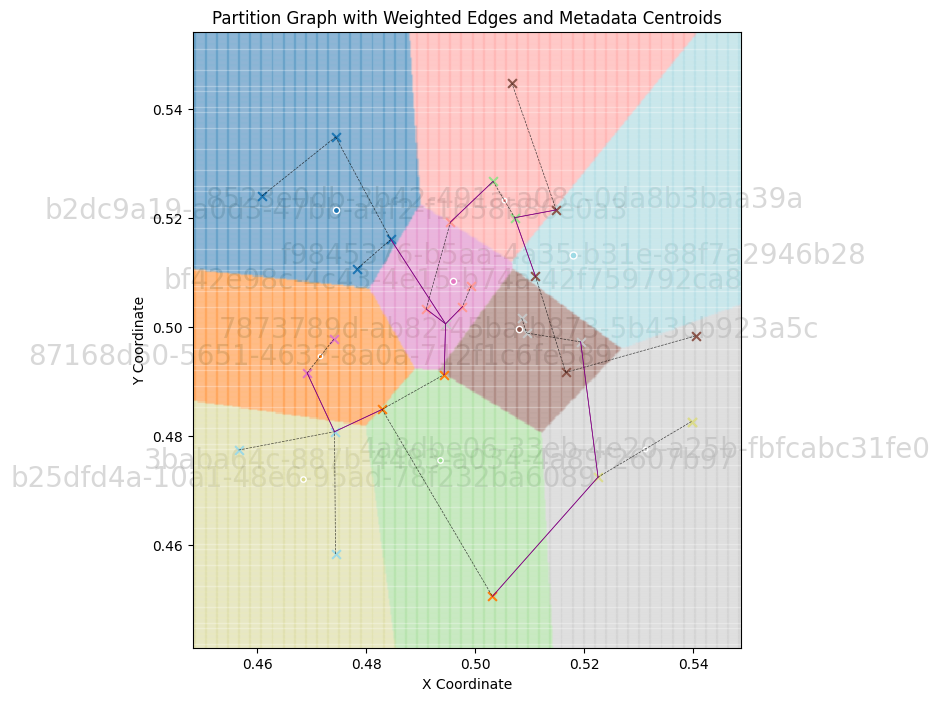

Response from '/insert': Vector received


<Figure size 1200x800 with 0 Axes>

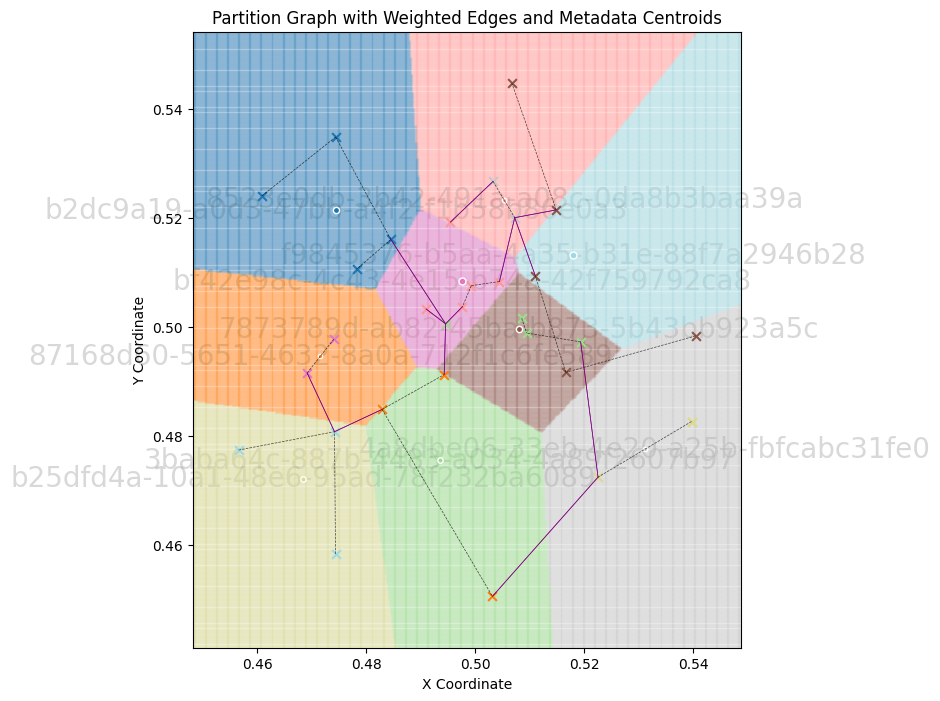

Response from '/insert': Vector received


ConnectionError: HTTPConnectionPool(host='localhost', port=3000): Max retries exceeded with url: /graph/for_partition (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x000001BB059BBBD0>: Failed to establish a new connection: [WinError 10061] No connection could be made because the target machine actively refused it'))

In [46]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.figure import Figure

batch = []
frames = []  # Store frames for the GIF

for i, vector in enumerate(vectors):
    batch.append({"vector": vector})  # Collect vectors in a batch

    # Send batch when it reaches size 10
    if len(batch) == 1:
        insert_batch_vector(batch)
        batch = []  # Reset the batch
        meta_data = get_metadata()
        partitions = get_vectors_by_partition(seq(meta_data).map(lambda x: x[0]).list())
        edges = seq(partitions).map(lambda x: get_edges_for_partition(x[0])).list()
        inter_edges = seq(partitions).map(lambda x: get_inter_edges_for_partition(x[0])).flatten().list()

        # Create a figure for the frame
        fig: Figure = plt.figure(figsize=(12, 8))
        plot_partition_graph(partitions, edges, meta_data, inter_edges)
        plt.close(fig)  # Close the plot to prevent displaying it during the loop
        frames.append(fig)

# Insert any remaining vectors in the final batch
if batch:
    insert_batch_vector(batch)
    meta_data = get_metadata()
    partitions = get_vectors_by_partition(seq(meta_data).map(lambda x: x[0]).list())
    edges = seq(partitions).map(lambda x: get_edges_for_partition(x[0])).list()
    inter_edges = seq(partitions).map(lambda x: get_inter_edges_for_partition(x[0])).flatten().list()

    # Create a figure for the final frame
    fig: Figure = plt.figure(figsize=(12, 8))
    plot_partition_graph(partitions, edges, meta_data, inter_edges)
    plt.close(fig)
    frames.append(fig)

# Create an animation and save it as a GIF
fig, ax = plt.subplots(figsize=(12, 8))
def update_frame(i):
    ax.clear()
    plot_partition_graph(partitions, edges, meta_data, inter_edges)

ani = animation.ArtistAnimation(fig, frames, interval=500, repeat_delay=1000)
ani.save('partition_graph_animation.gif', writer='pillow')


In [43]:
meta_data = get_metadata()
partitions = get_vectors_by_partition(seq(meta_data).map(lambda x: x[0]).list())
edges = seq(partitions).map(lambda x: get_edges_for_partition(x[0])).list()
inter_edges = seq(partitions).map(lambda x: get_inter_edges_for_partition(x[0])).flatten().list()

# Create a figure for the final frame
fig: Figure = plt.figure(figsize=(12, 8))
plot_partition_graph(partitions, edges, meta_data, inter_edges)

ConnectionError: HTTPConnectionPool(host='localhost', port=3000): Max retries exceeded with url: /metadata (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x000001BB06BA1690>: Failed to establish a new connection: [WinError 10061] No connection could be made because the target machine actively refused it'))

In [45]:
vectors[11]

[0.4691366163130478, 0.4915732838146507]

IndexError: list index out of range

Error in callback <function _draw_all_if_interactive at 0x000001BB60C2E0C0> (for post_execute), with arguments args (),kwargs {}:


TypeError: 'Figure' object is not iterable

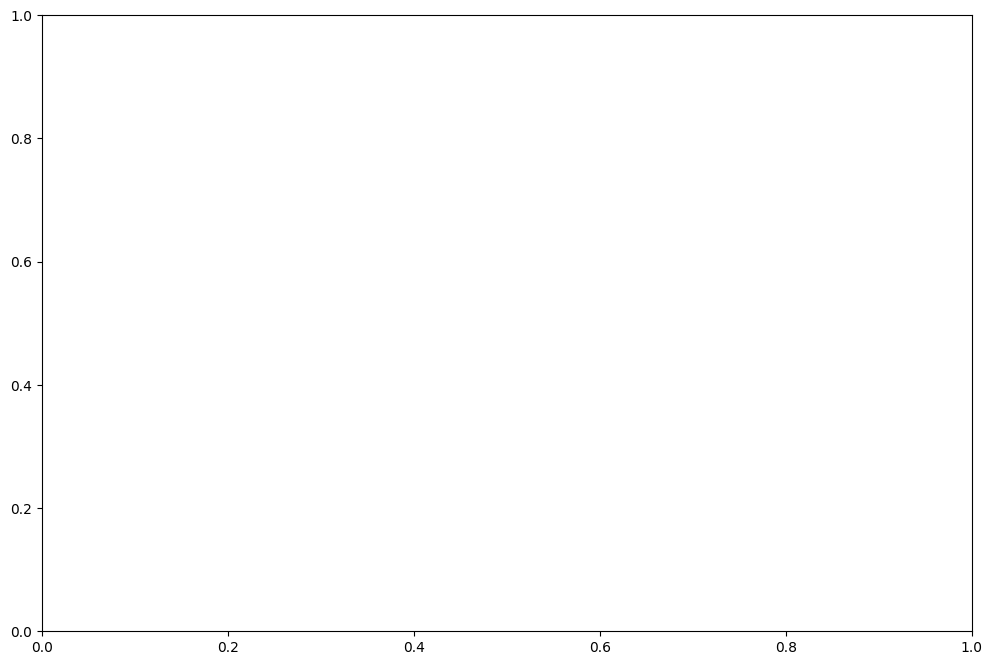

In [12]:

# Create an animation and save it as a GIF
fig, ax = plt.subplots(figsize=(12, 8))
def update_frame(i):
    ax.clear()
    plot_partition_graph(partitions, edges, meta_data, inter_edges)

ani = animation.ArtistAnimation(fig, frames, interval=500, repeat_delay=1000)
ani.save('partition_graph_animation.gif', writer='pillow')


In [15]:
clusters

[Cluster(center=[0.1, 0.1], radius=0.05, num_points=100),
 Cluster(center=[0.7, 0.7], radius=0.2, num_points=30),
 Cluster(center=[0.4, 0.4], radius=0.15, num_points=50),
 Cluster(center=[0.9, 0.1], radius=0.1, num_points=80)]

In [16]:

composite_cluster_centers

[[0.5, 0.5], [0.55, 0.55], [0.5, 0.6], [0.45, 0.55]]

In [17]:
knn_query([0.1,0.1], 100)

Response from '/knn': [("3332090b-941e-48b6-8988-626864982d9b", 0.018304342), ("c329b2be-84b1-4699-8bb2-29b0035baee7", 0.03410304)]


'[("3332090b-941e-48b6-8988-626864982d9b", 0.018304342), ("c329b2be-84b1-4699-8bb2-29b0035baee7", 0.03410304)]'